# Playground for Clustering Slides

- Stephen W. Thomas
- Used for MMA 869 and MMAI 869

In [1]:
import datetime
print(datetime.datetime.now())

2019-04-05 14:01:01.606851


In [2]:
import pandas as pd
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns 

from sklearn.metrics import silhouette_score, silhouette_samples
import sklearn.metrics
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture

import pandas_profiling

import itertools

import scipy

from yellowbrick.cluster import SilhouetteVisualizer, InterclusterDistance, KElbowVisualizer

from kmodes.kmodes import KModes

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# This will ensure that matplotlib figures don't get cut off when saving with savefig()
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

C:\Users\st50\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas_profiling\plot.py:15: UserWarning: matplotlib.pyplot as already been imported, this call will have no effect.
  matplotlib.use(BACKEND)


# Read in Data

In [3]:
df = pd.read_csv("https://raw.githubusercontent.com/stepthom/sandbox/master/data/Mall_Customers.csv")

df = df.rename(index=str, columns={"Genre": "Male"})
df['Male'] = df['Male'].replace(['Male', 'Female'], [True, False])

list(df)
df.shape
df.info()
df.describe().transpose()
df.head(n=20)
df.tail()

['CustomerID', 'Male', 'Age', 'AnnualIncome', 'SpendingScore']

(200, 5)

<class 'pandas.core.frame.DataFrame'>
Index: 200 entries, 0 to 199
Data columns (total 5 columns):
CustomerID       200 non-null int64
Male             200 non-null bool
Age              200 non-null int64
AnnualIncome     200 non-null int64
SpendingScore    200 non-null int64
dtypes: bool(1), int64(4)
memory usage: 8.0+ KB


,count,mean,std,min,25%,50%,75%,max
CustomerID,200.0,100.50,57.879185,1.0,50.75,100.5,150.25,200.0
Age,200.0,38.85,13.969007,18.0,28.75,36.0,49.00,70.0
AnnualIncome,200.0,60.56,26.264721,15.0,41.50,61.5,78.00,137.0
SpendingScore,200.0,50.20,25.823522,1.0,34.75,50.0,73.00,99.0


,CustomerID,Male,Age,AnnualIncome,SpendingScore
0,1,True,19,15,39
1,2,True,21,15,81
2,3,False,20,16,6
3,4,False,23,16,77
4,5,False,31,17,40
5,6,False,22,17,76
6,7,False,35,18,6
7,8,False,23,18,94
8,9,True,64,19,3
9,10,False,30,19,72


,CustomerID,Male,Age,AnnualIncome,SpendingScore
195,196,False,35,120,79
196,197,False,45,126,28
197,198,True,32,126,74
198,199,True,32,137,18
199,200,True,30,137,83


## Profile the Data

In [4]:
pandas_profiling.ProfileReport(df, check_correlation=False)

Number of variables,6
Number of observations,200
Total Missing (%),0.0%
Total size in memory,8.1 KiB
Average record size in memory,41.4 B
Numeric,4
Categorical,0
Boolean,1
Date,0
Text (Unique),1
Rejected,0


# Normalize the Data

In [5]:
X = df.copy()
X = X.drop(['CustomerID', 'Age', 'Male'], axis=1)
X.head(10)

,AnnualIncome,SpendingScore
0,15,39
1,15,81
2,16,6
3,16,77
4,17,40
5,17,76
6,18,6
7,18,94
8,19,3
9,19,72


In [6]:
scaler = StandardScaler()
features = ['AnnualIncome', 'SpendingScore']
X[features] = scaler.fit_transform(X[features])

In [7]:
X.shape
X.info()
X.describe().transpose()
X.head(10)
X.tail()

(200, 2)

<class 'pandas.core.frame.DataFrame'>
Index: 200 entries, 0 to 199
Data columns (total 2 columns):
AnnualIncome     200 non-null float64
SpendingScore    200 non-null float64
dtypes: float64(2)
memory usage: 4.7+ KB


,count,mean,std,min,25%,50%,75%,max
AnnualIncome,200.0,-6.128431e-16,1.002509,-1.738999,-0.727509,0.035879,0.665675,2.917671
SpendingScore,200.0,-1.121325e-16,1.002509,-1.910021,-0.599793,-0.007764,0.885132,1.894492


,AnnualIncome,SpendingScore
0,-1.738999,-0.434801
1,-1.738999,1.195704
2,-1.700830,-1.715913
3,-1.700830,1.040418
4,-1.662660,-0.395980
5,-1.662660,1.001596
6,-1.624491,-1.715913
7,-1.624491,1.700384
8,-1.586321,-1.832378
9,-1.586321,0.846310


,AnnualIncome,SpendingScore
195,2.268791,1.118061
196,2.497807,-0.861839
197,2.497807,0.923953
198,2.917671,-1.250054
199,2.917671,1.273347


## Plot the Data

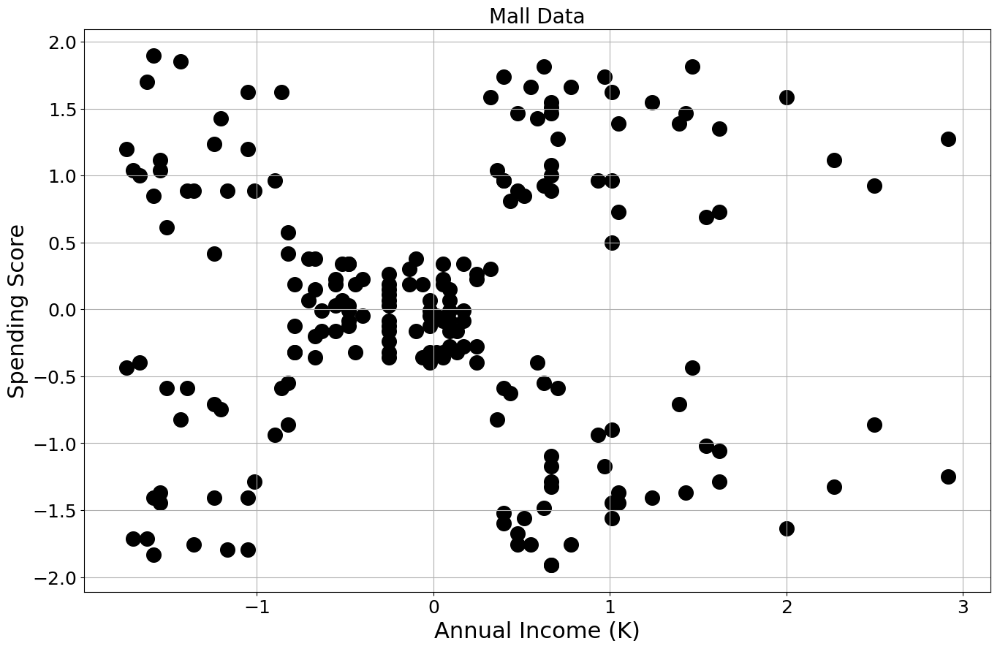

In [8]:
plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c="black", s=200);
plt.title("Mall Data", fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);
plt.savefig('out/mall.png');

# K-Means

In [9]:
k_means = KMeans(init='k-means++', n_clusters=5, n_init=10, random_state=42)
k_means.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=5, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

In [10]:
k_means.labels_

array([2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3,
       2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 3, 2, 0,
       2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 1, 4, 0, 4, 1, 4, 1, 4,
       0, 4, 1, 4, 1, 4, 1, 4, 1, 4, 0, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4,
       1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4,
       1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4, 1, 4,
       1, 4])

In [11]:
# Let's look at the centers
k_means.cluster_centers_

array([[-0.20091257, -0.02645617],
       [ 1.05500302, -1.28443907],
       [-1.30751869, -1.13696536],
       [-1.32954532,  1.13217788],
       [ 0.99158305,  1.23950275]])

# Plot the Clusters

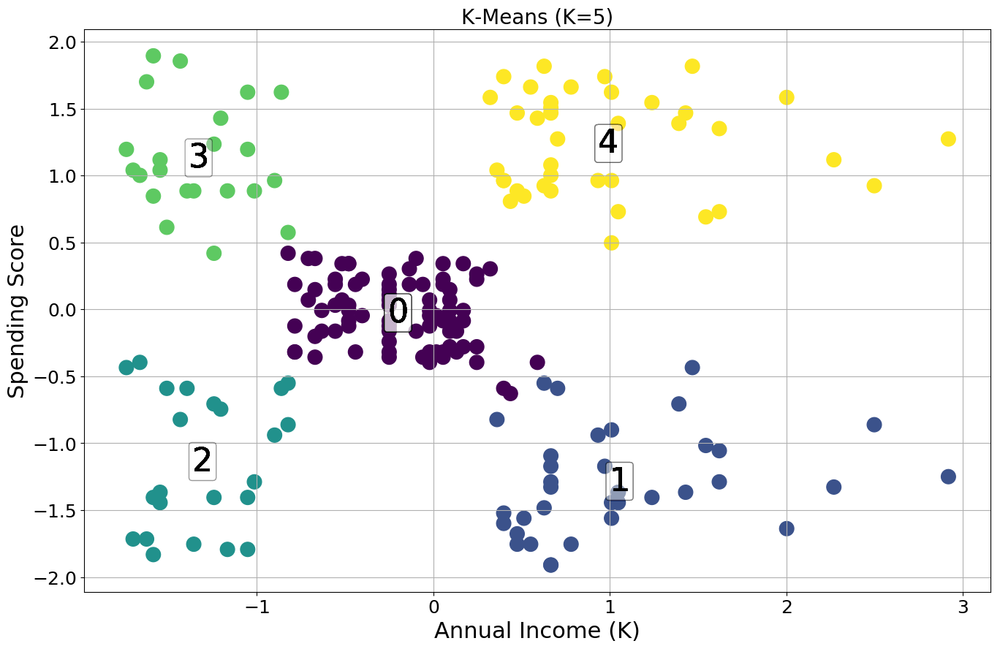

In [12]:
plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

sc = plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=200, c=k_means.labels_);
#plt.scatter(k_means.cluster_centers_[:, 0], k_means.cluster_centers_[:, 1], marker='x', s=500, c="black")
plt.title("K-Means (K=5)", fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

for label in k_means.labels_:
    plt.text(x=k_means.cluster_centers_[label, 0], y=k_means.cluster_centers_[label, 1], s=label, fontsize=32, 
             horizontalalignment='center', verticalalignment='center', color='black',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.1', alpha=0.02));

plt.savefig('out/mall-kmeans-5.png');

## Internal Validation Metrics

In [13]:
# WCSS == Inertia
k_means.inertia_

65.56840815571681

In [14]:
silhouette_score(X, k_means.labels_)

0.5546571631111091

C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


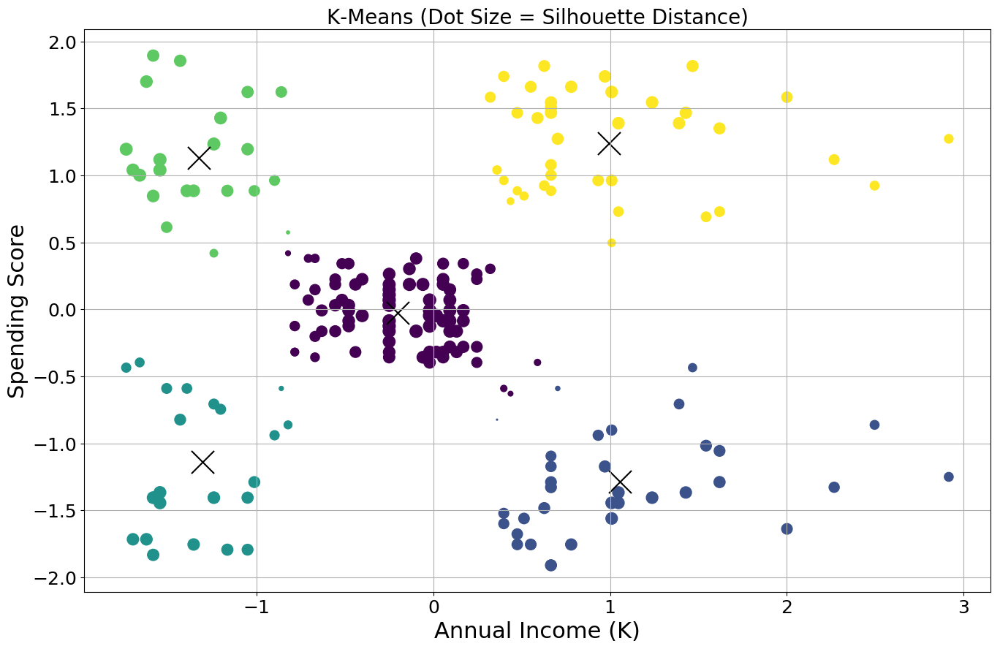

In [15]:
plt.style.use('default');

sample_silhouette_values = silhouette_samples(X, k_means.labels_)
sizes = 200*sample_silhouette_values

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=sizes, c=k_means.labels_)
plt.scatter(k_means.cluster_centers_[:, 0], k_means.cluster_centers_[:, 1], marker='x', s=500, c="black")

plt.title("K-Means (Dot Size = Silhouette Distance)", fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

plt.savefig('out/mall-kmeans-5-silhouette-size.png');

In [16]:
#sklearn.metrics.davies_bouldin_score(X, k_means.labels_)

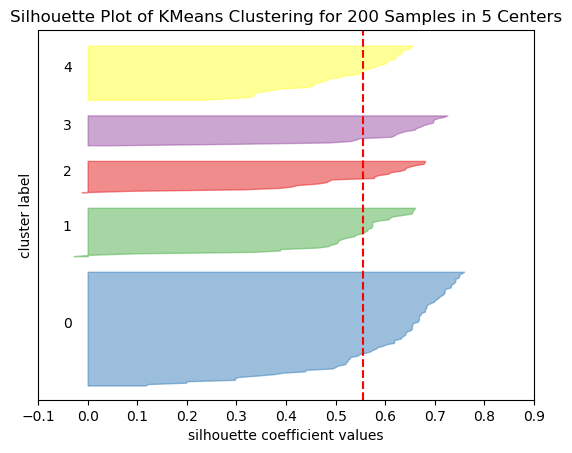

In [17]:
visualizer = SilhouetteVisualizer(k_means)
visualizer.fit(X)
visualizer.poof()
fig = visualizer.ax.get_figure()
fig.savefig('out/mall-kmeans-5-silhouette.png', transparent=False);

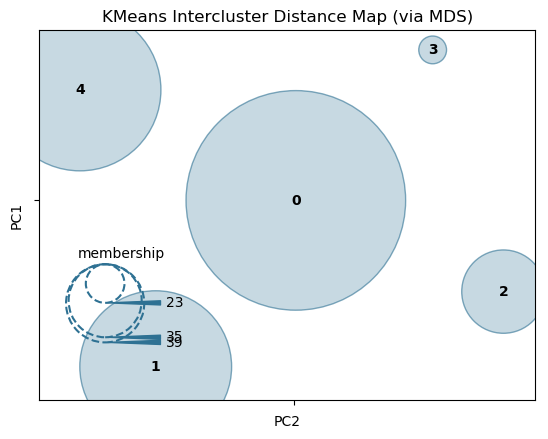

<Figure size 640x480 with 0 Axes>

In [18]:
# Instantiate the clustering model and visualizer
visualizer = InterclusterDistance(k_means)

visualizer.fit(X) # Fit the training data to the visualizer
visualizer.poof() # Draw/show/poof the data
plt.savefig('out/mall-kmeans-5-tsne.png', transparent=False);

## Elbow Method (Manual)

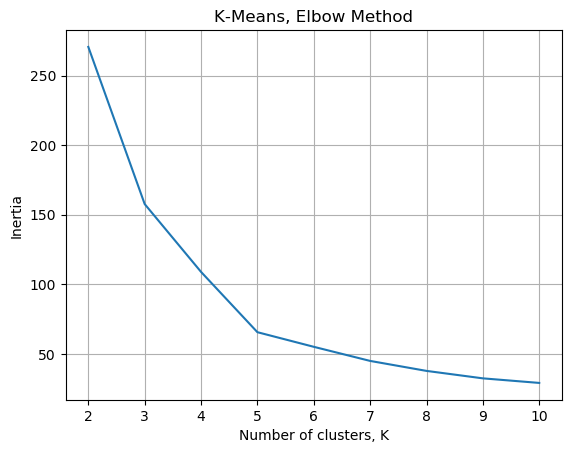

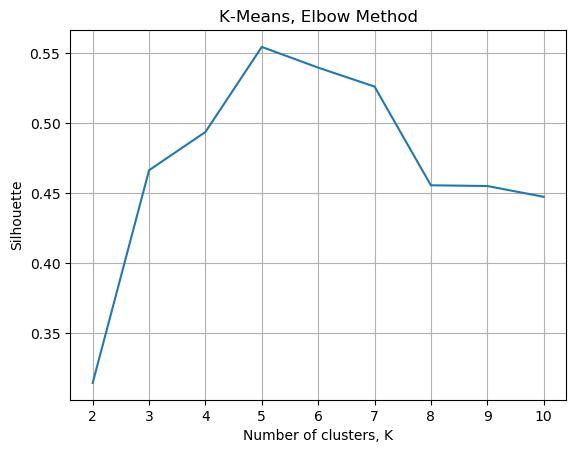

In [19]:
inertias = {}
silhouettes = {}
for k in range(2, 11):
    kmeans = KMeans(init='k-means++', n_init=10, n_clusters=k, max_iter=1000, random_state=42).fit(X)
    inertias[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
    silhouettes[k] = silhouette_score(X, kmeans.labels_, metric='euclidean')
    

plt.figure();
plt.grid(True);
plt.plot(list(inertias.keys()), list(inertias.values()));
plt.title('K-Means, Elbow Method')
plt.xlabel("Number of clusters, K");
plt.ylabel("Inertia");
plt.savefig('out/mall-kmeans-elbow-interia.png');


plt.figure();
plt.grid(True);
plt.plot(list(silhouettes.keys()), list(silhouettes.values()));
plt.title('K-Means, Elbow Method')
plt.xlabel("Number of clusters, K");
plt.ylabel("Silhouette");
plt.savefig('out/mall-kmeans-elbow-silhouette.png');

## Elbow Method (Using Yellowbrick Package)

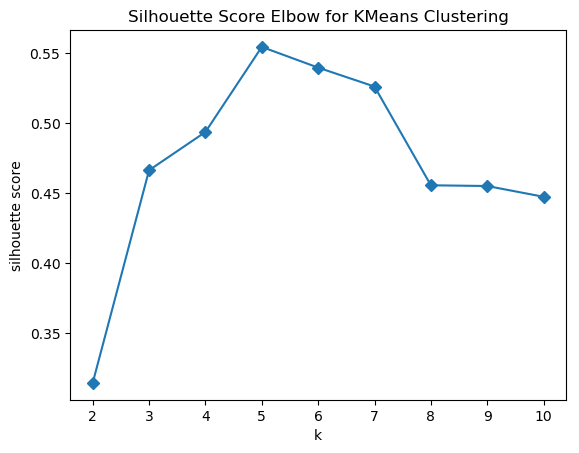

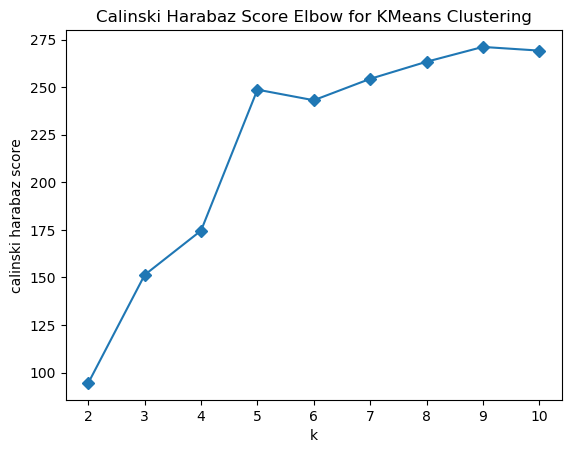

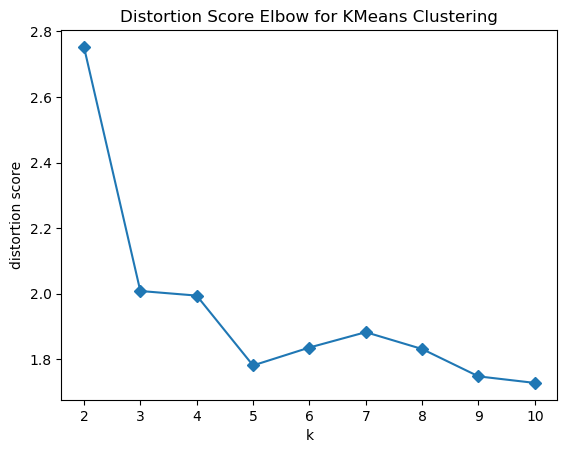

In [20]:
model = KMeans(init='k-means++', n_init=10, max_iter=1000, random_state=42)
KElbowVisualizer(model, k=(2,11), metric='silhouette', timings=False).fit(X).poof();
KElbowVisualizer(model, k=(2,11), metric='calinski_harabaz', timings=False).fit(X).poof();
KElbowVisualizer(model, k=(2,11), metric='distortion', timings=False).fit(X).poof();

## Intepretting the Clusters

### Means

In [21]:
k_means.cluster_centers_

array([[-0.20091257, -0.02645617],
       [ 1.05500302, -1.28443907],
       [-1.30751869, -1.13696536],
       [-1.32954532,  1.13217788],
       [ 0.99158305,  1.23950275]])

In [22]:
for label in set(k_means.labels_):
    print('\nCluster {}:'.format(label))
    X_tmp = X[k_means.labels_==label].copy()
    X_tmp.loc['mean'] = X_tmp.mean()
    X_tmp.tail(13)
    


Cluster 0:


,AnnualIncome,SpendingScore
114,0.169472,-0.085407
115,0.169472,-0.007764
116,0.169472,-0.279515
117,0.169472,0.341630
118,0.245811,-0.279515
119,0.245811,0.263987
120,0.245811,0.225165
121,0.245811,-0.395980
122,0.322150,0.302808
126,0.398489,-0.590088



Cluster 1:


,AnnualIncome,SpendingScore
176,1.047369,-1.366519
178,1.238216,-1.405340
180,1.390894,-0.706552
182,1.429063,-1.366519
184,1.467233,-0.434801
186,1.543572,-1.017125
188,1.619911,-1.288876
190,1.619911,-1.055946
192,2.001605,-1.638270
194,2.268791,-1.327697



Cluster 2:


,AnnualIncome,SpendingScore
22,-1.357305,-1.754735
24,-1.242797,-1.405340
26,-1.242797,-0.706552
28,-1.204627,-0.745374
30,-1.166458,-1.793556
32,-1.051949,-1.793556
34,-1.051949,-1.405340
36,-1.013780,-1.288876
38,-0.899272,-0.939482
40,-0.861102,-0.590088



Cluster 3:


,AnnualIncome,SpendingScore
21,-1.395474,0.885132
23,-1.357305,0.885132
25,-1.242797,1.234526
27,-1.242797,0.419273
29,-1.204627,1.428633
31,-1.166458,0.885132
33,-1.051949,1.622741
35,-1.051949,1.195704
37,-1.013780,0.885132
39,-0.899272,0.962775



Cluster 4:


,AnnualIncome,SpendingScore
177,1.047369,0.729845
179,1.238216,1.545098
181,1.390894,1.389812
183,1.429063,1.467455
185,1.467233,1.816849
187,1.543572,0.691024
189,1.619911,1.350990
191,1.619911,0.729845
193,2.001605,1.583920
195,2.268791,1.118061


# Find Examplars

Let's find the observation that is closest to the cluster center

In [23]:
from scipy.spatial import distance

for i, label in enumerate(set(k_means.labels_)):    
    X_tmp = X[k_means.labels_==label].copy()
    
    exemplar_idx = distance.cdist([k_means.cluster_centers_[i]], X_tmp).argmin()
    exemplar = pd.DataFrame(X_tmp.iloc[exemplar_idx])
   
    print('\nCluster {}:'.format(label))
    exemplar


Cluster 0:


,80
AnnualIncome,-0.250391
SpendingScore,0.031057



Cluster 1:


,176
AnnualIncome,1.047369
SpendingScore,-1.366519



Cluster 2:


,24
AnnualIncome,-1.242797
SpendingScore,-1.405340



Cluster 3:


,25
AnnualIncome,-1.242797
SpendingScore,1.234526



Cluster 4:


,175
AnnualIncome,1.047369
SpendingScore,1.389812


### Snake Plot

C:\Users\st50\AppData\Local\Continuum\anaconda3\lib\site-packages\scipy\stats\stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


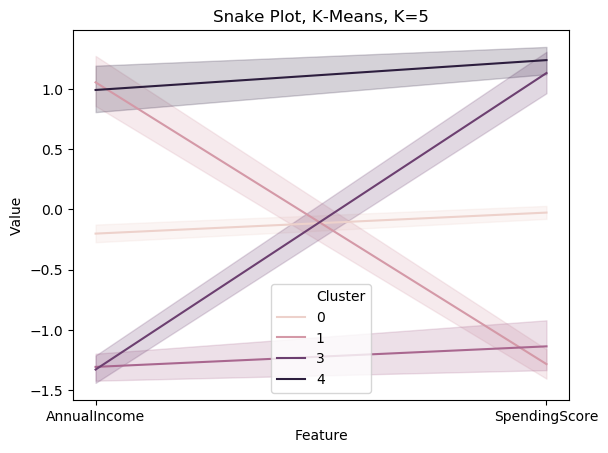

In [24]:
dat = X.copy()

dat['Cluster'] = k_means.labels_

datamart_melt = pd.melt(dat.reset_index(),
id_vars=['Cluster'],
value_vars=['AnnualIncome','SpendingScore'],
var_name='Feature',
value_name='Value')

plt.title('Snake Plot, K-Means, K=5')
sns.lineplot(x="Feature", y="Value", hue='Cluster', data=datamart_melt)
plt.savefig('out/mall-kmeans-5-snake.png', transparent=False);

# Relative Importance Plots

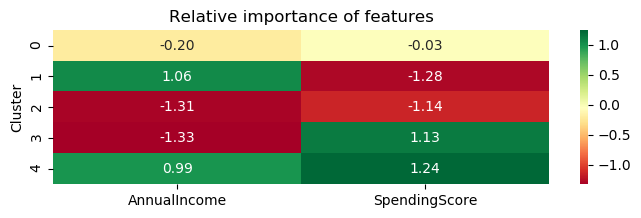

In [25]:
cluster_avg = dat.groupby(['Cluster']).mean()
population_avg = dat.drop(['Cluster'], axis=1).mean()

relative_imp = cluster_avg - population_avg

plt.figure(figsize=(8, 2));
plt.title('Relative importance of features');
sns.heatmap(data=relative_imp, annot=True, fmt='.2f', cmap='RdYlGn');
plt.savefig('out/mall-kmeans-5-importance.png', transparent=False);

## Experiment with Lots of Ks

C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


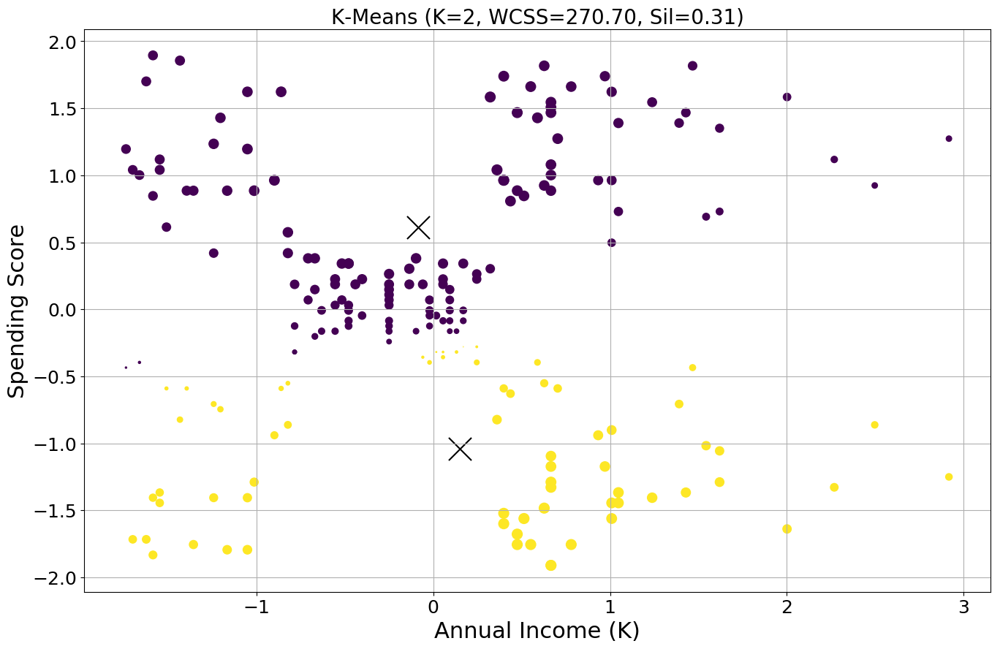

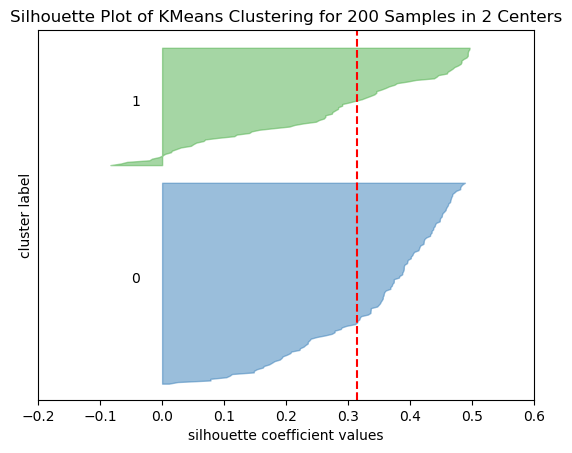

K=2, WCSS=270.70, Sil=0.31


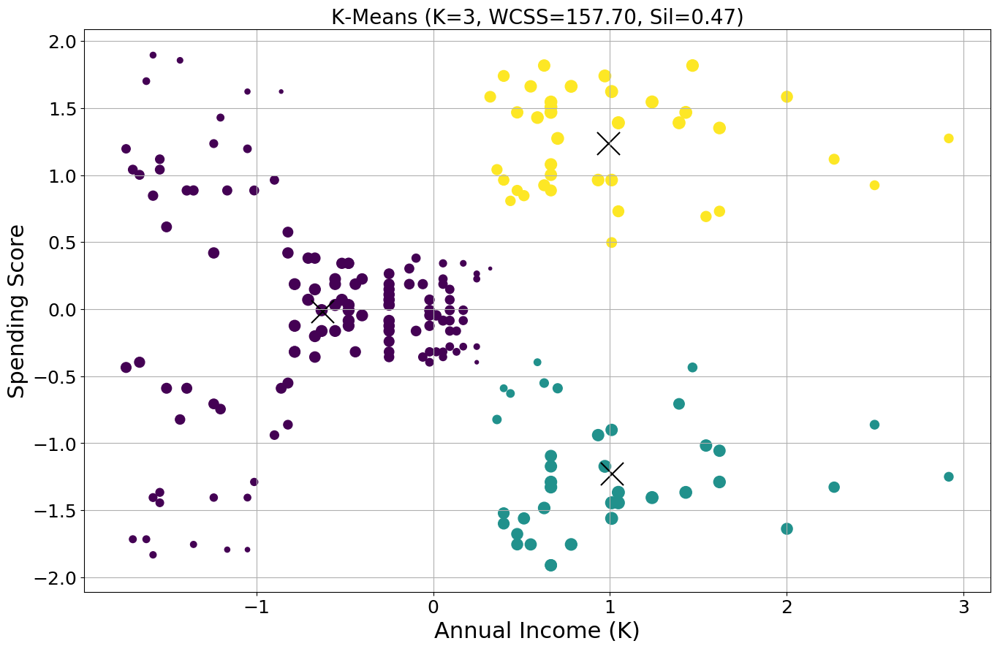

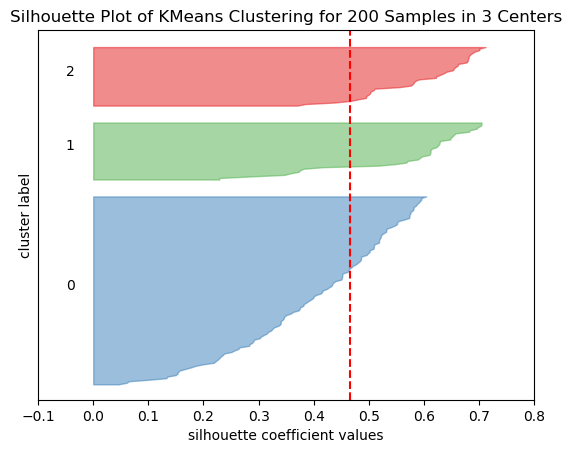

K=3, WCSS=157.70, Sil=0.47


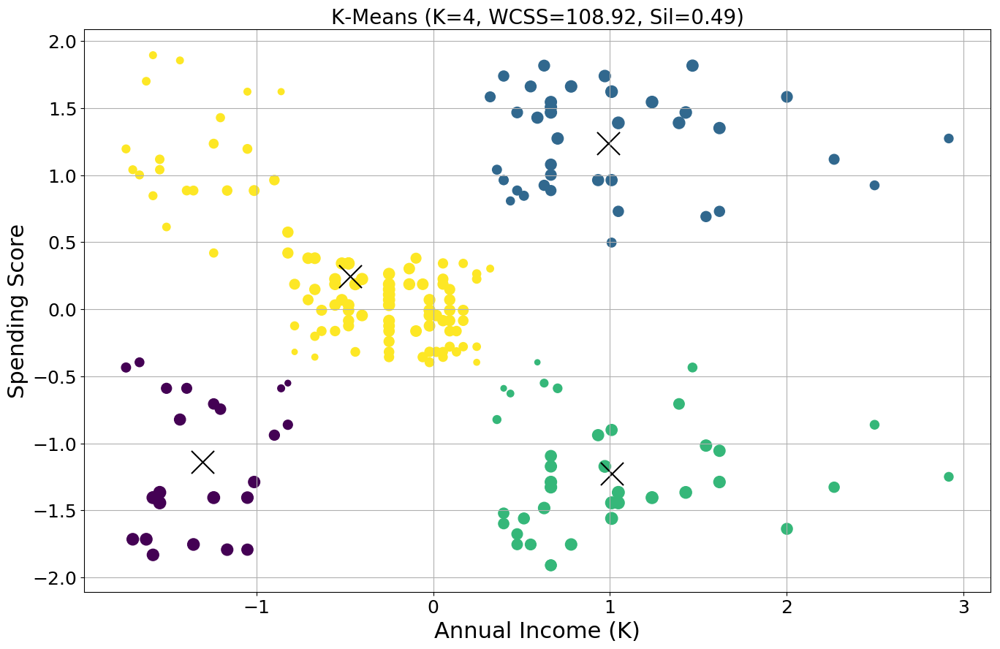

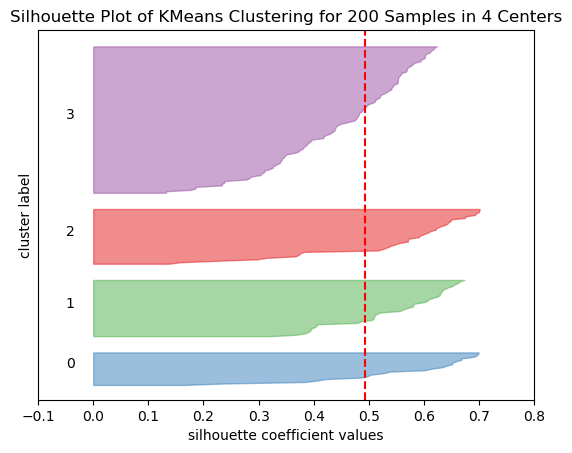

K=4, WCSS=108.92, Sil=0.49


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


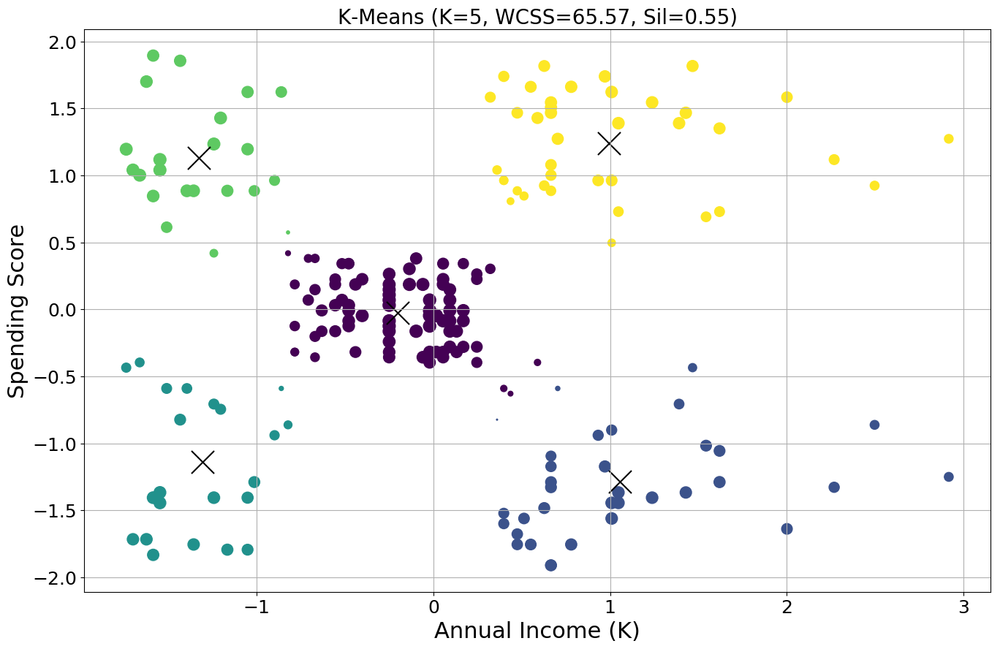

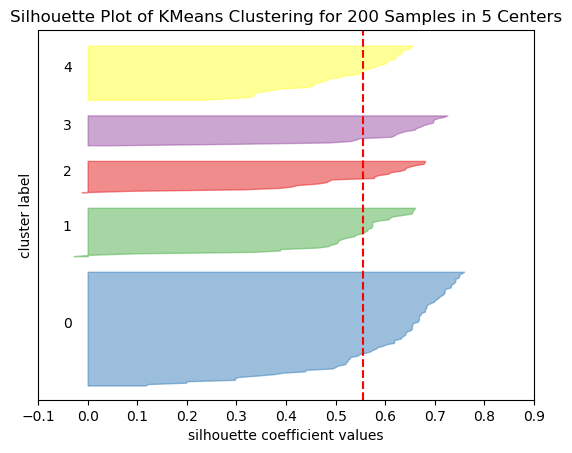

K=5, WCSS=65.57, Sil=0.55


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


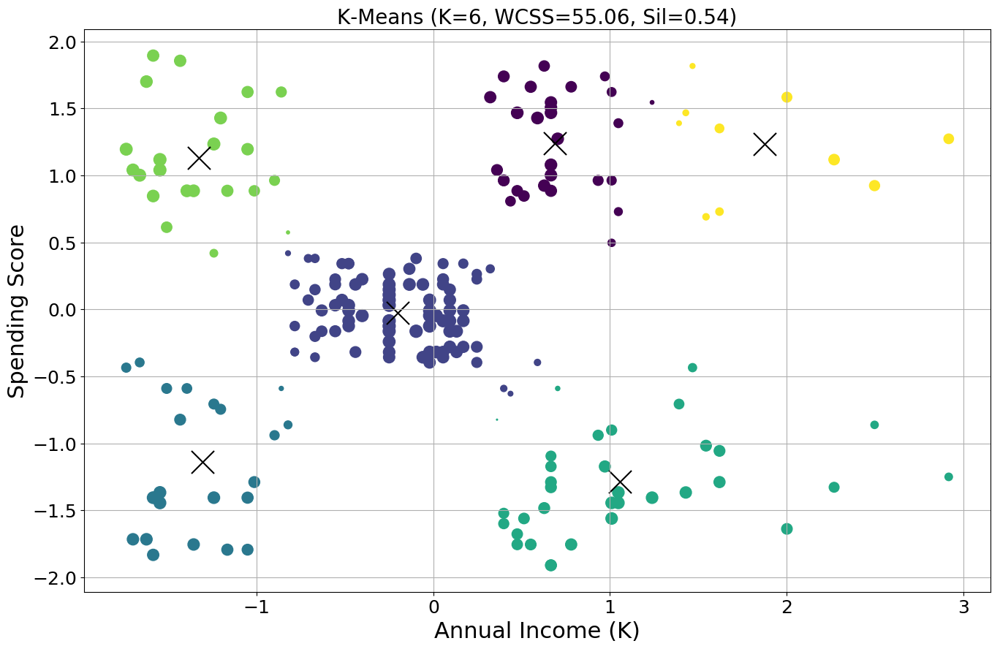

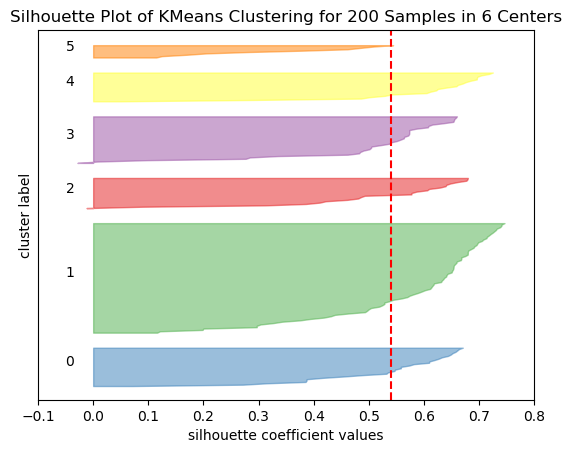

K=6, WCSS=55.06, Sil=0.54


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


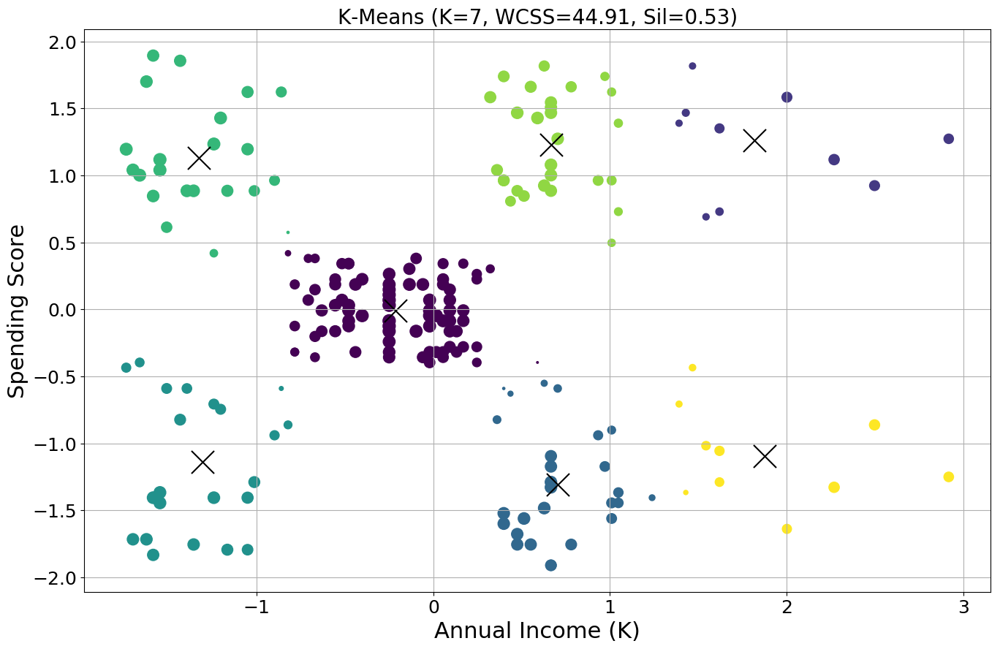

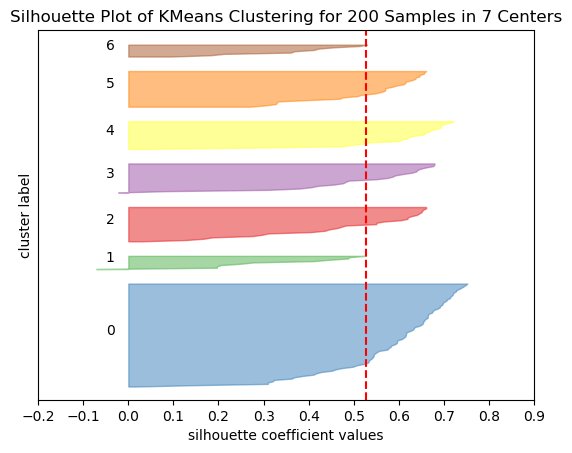

K=7, WCSS=44.91, Sil=0.53


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


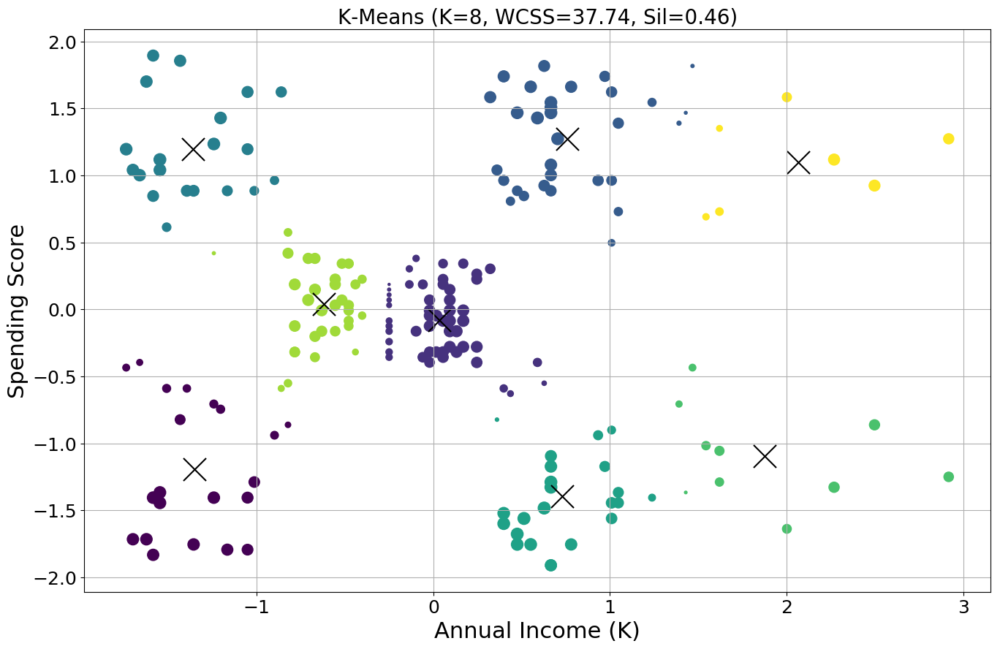

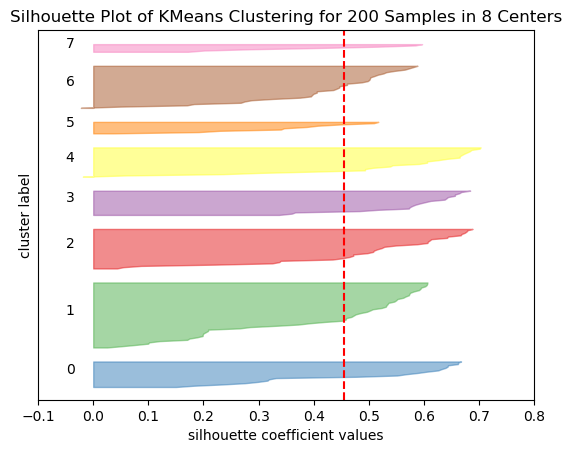

K=8, WCSS=37.74, Sil=0.46


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


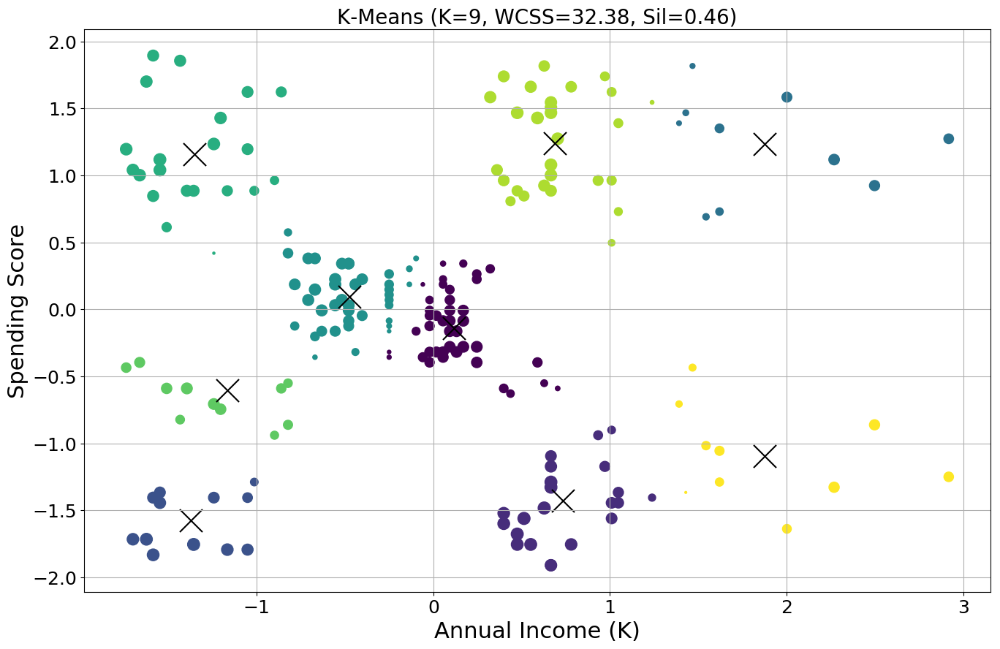

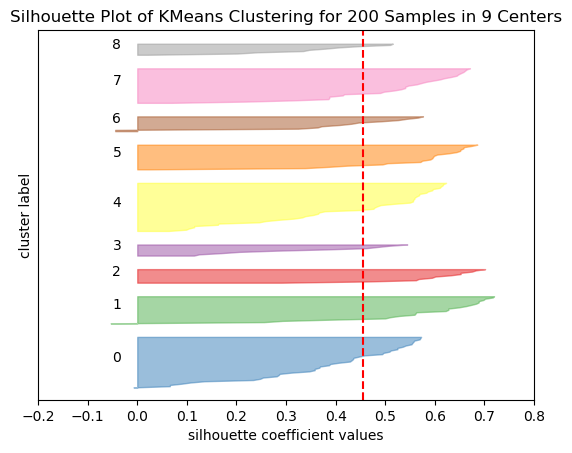

K=9, WCSS=32.38, Sil=0.46


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


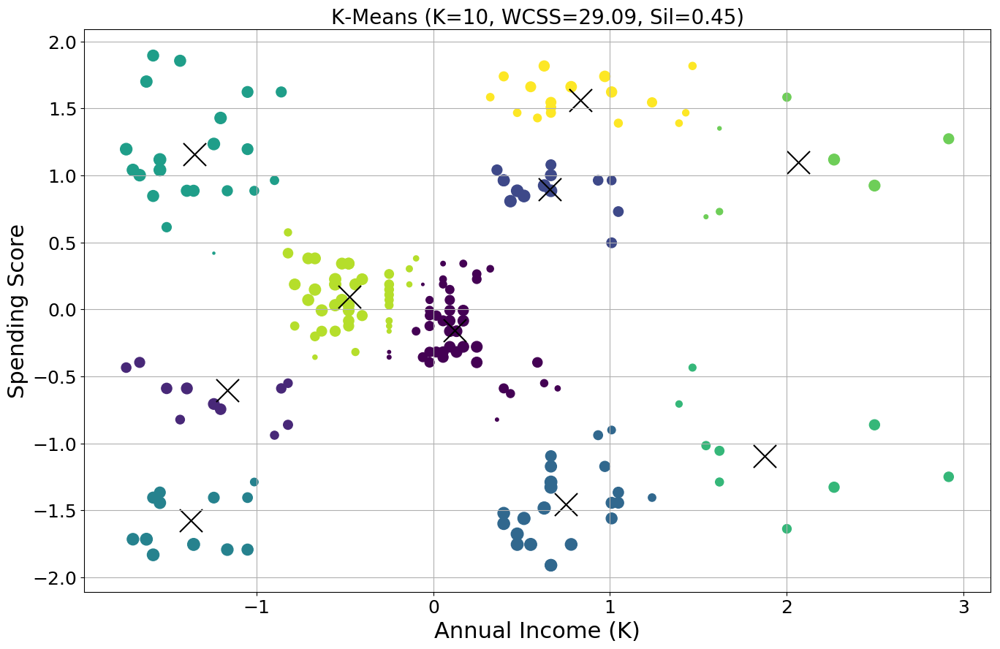

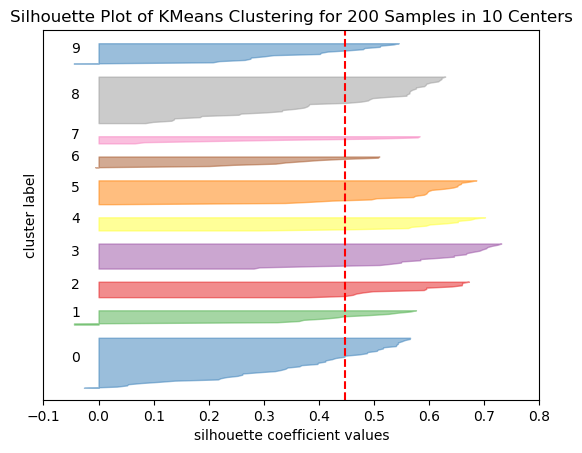

K=10, WCSS=29.09, Sil=0.45


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


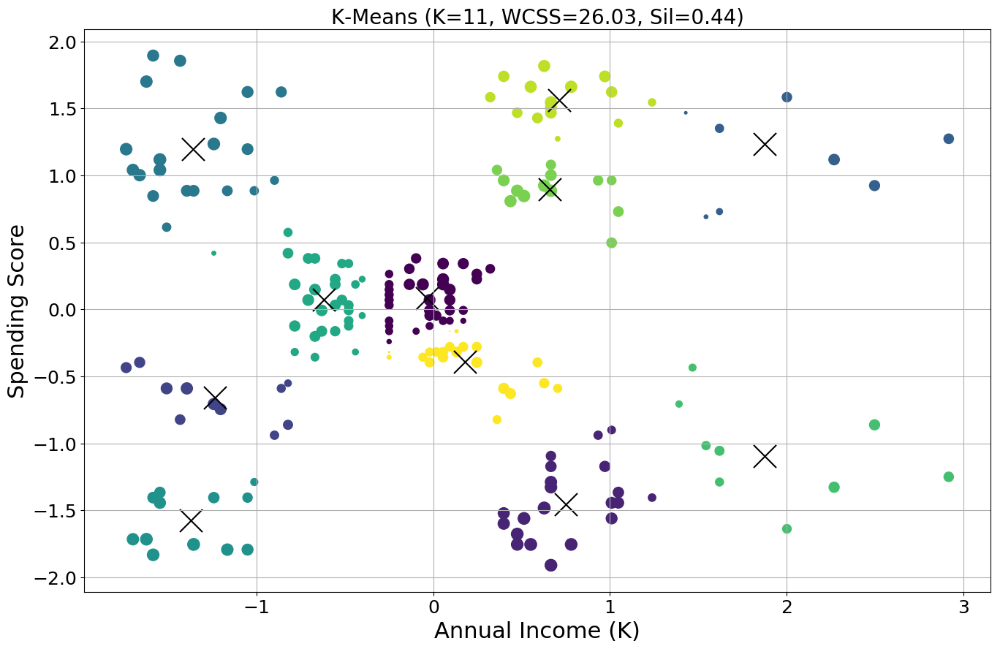

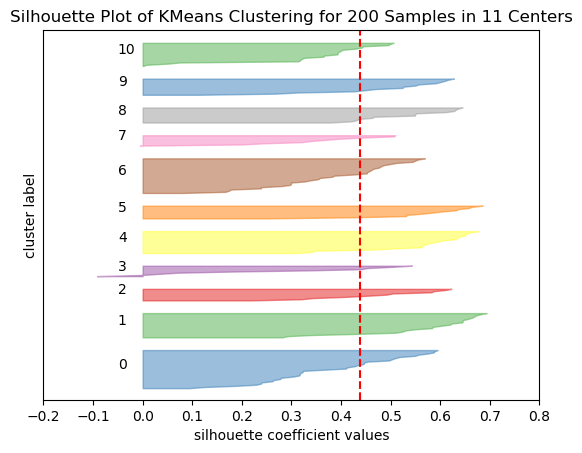

K=11, WCSS=26.03, Sil=0.44


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


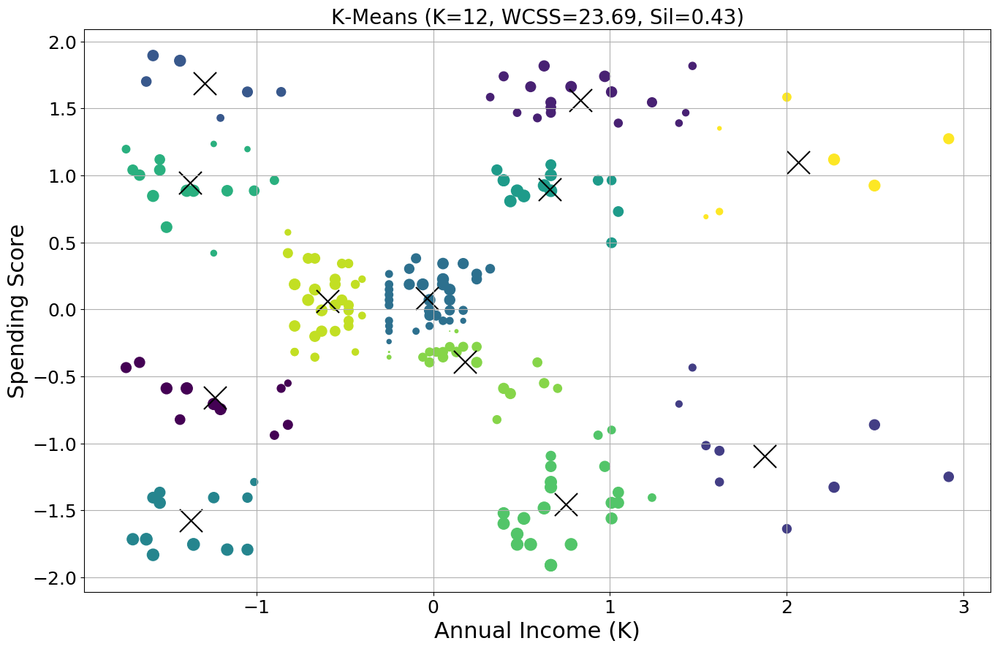

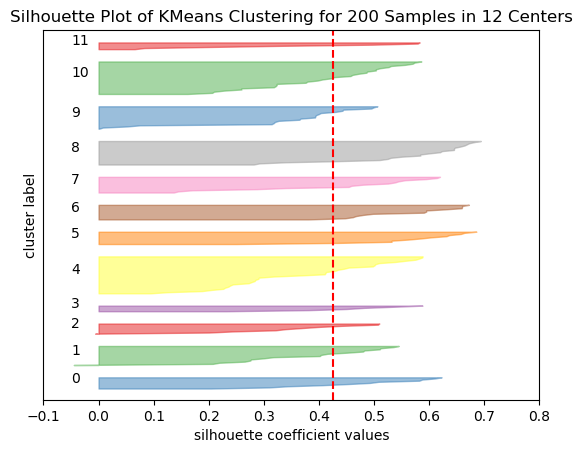

K=12, WCSS=23.69, Sil=0.43


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


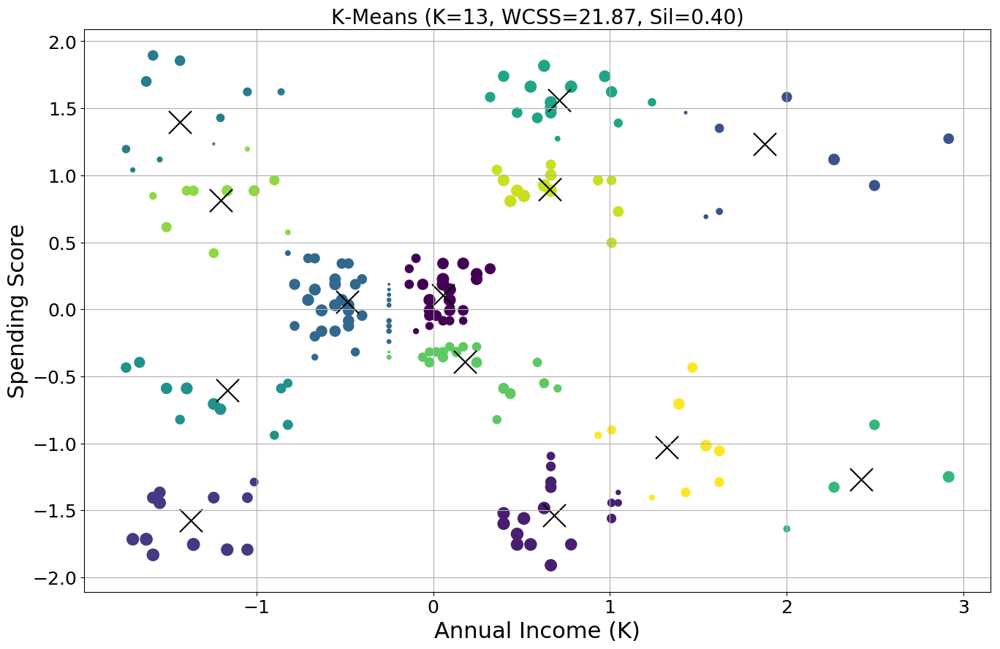

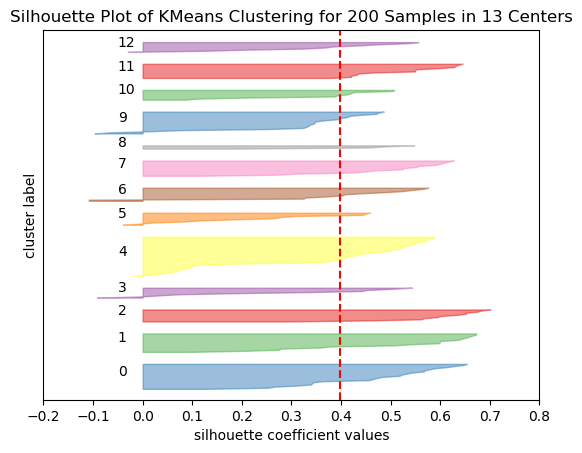

K=13, WCSS=21.87, Sil=0.40


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


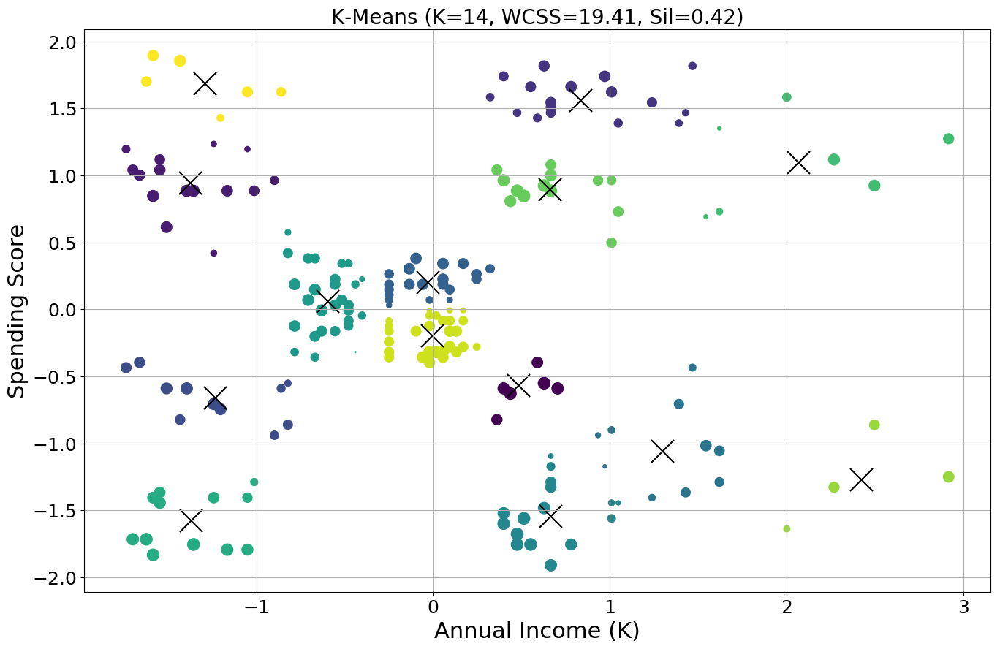

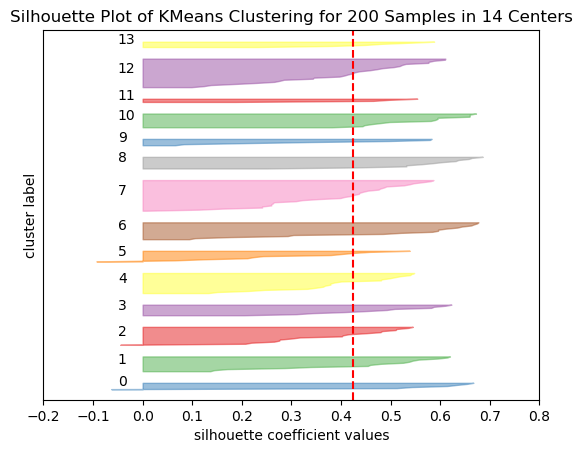

K=14, WCSS=19.41, Sil=0.42


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


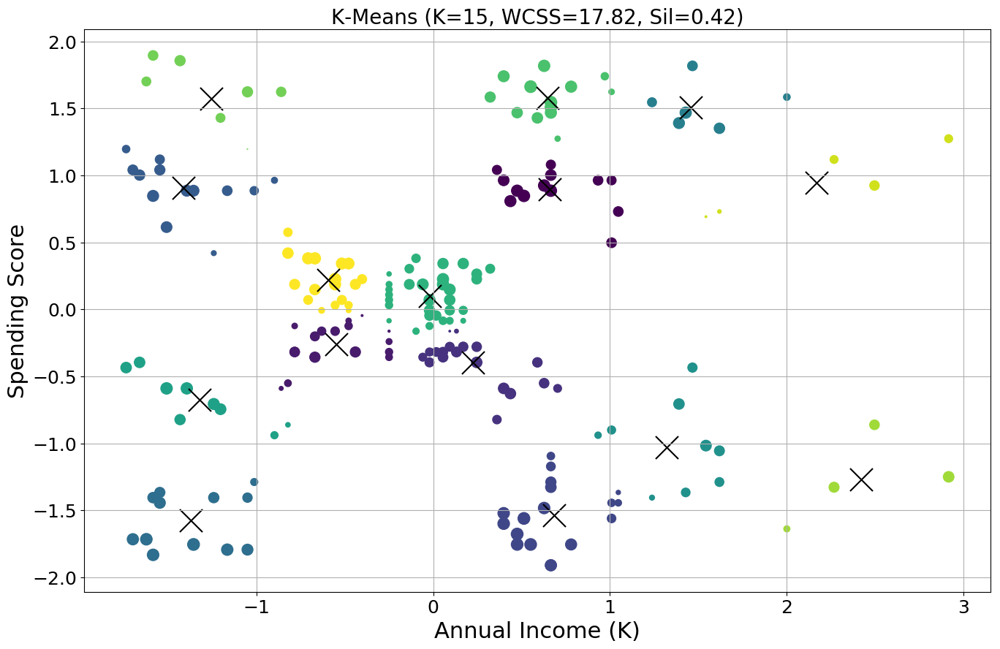

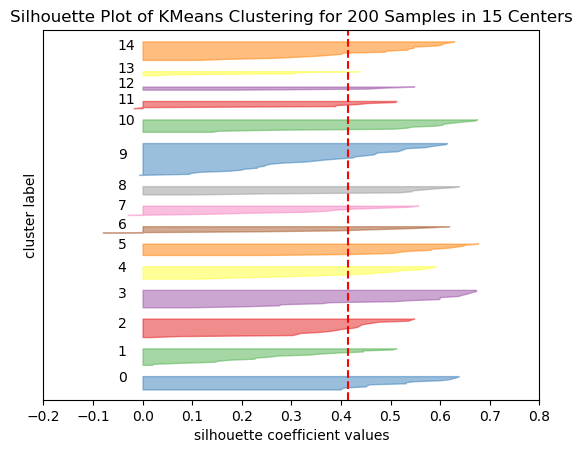

K=15, WCSS=17.82, Sil=0.42


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


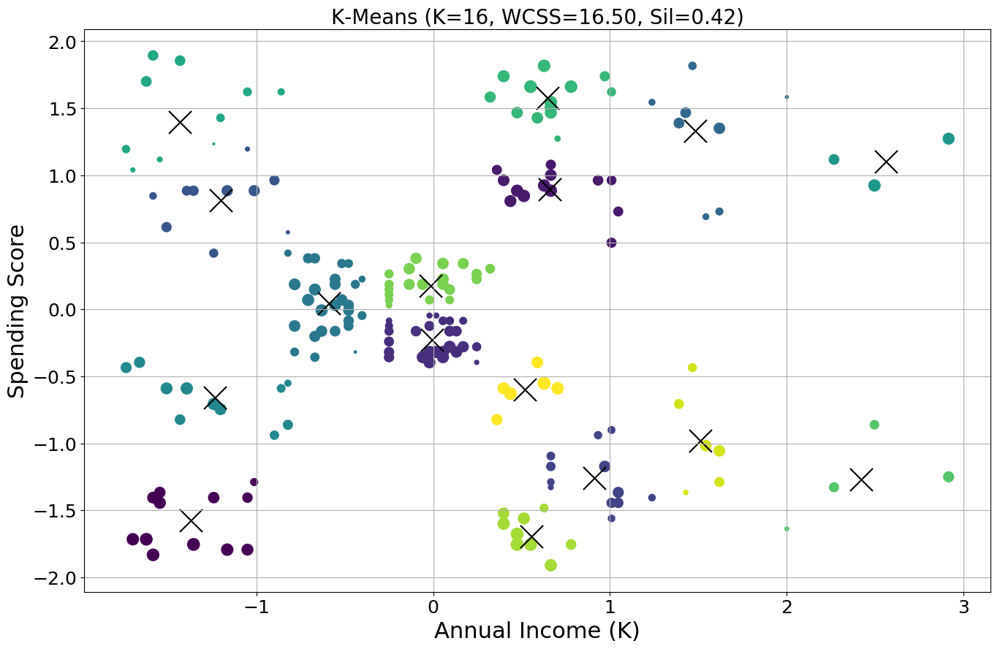

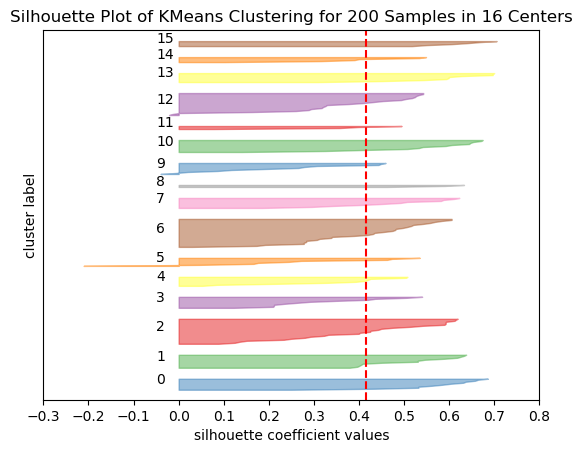

K=16, WCSS=16.50, Sil=0.42


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


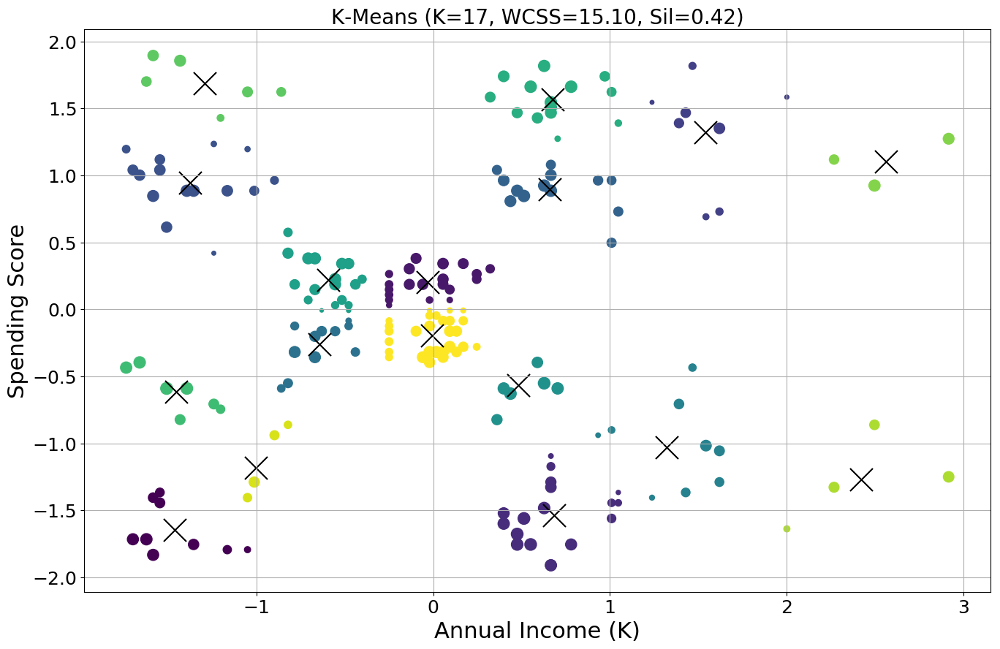

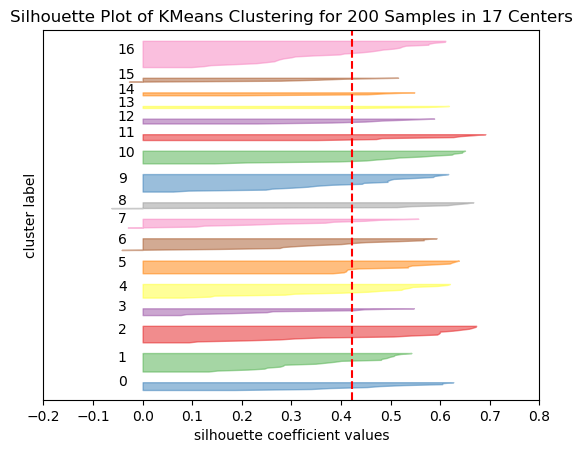

K=17, WCSS=15.10, Sil=0.42


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


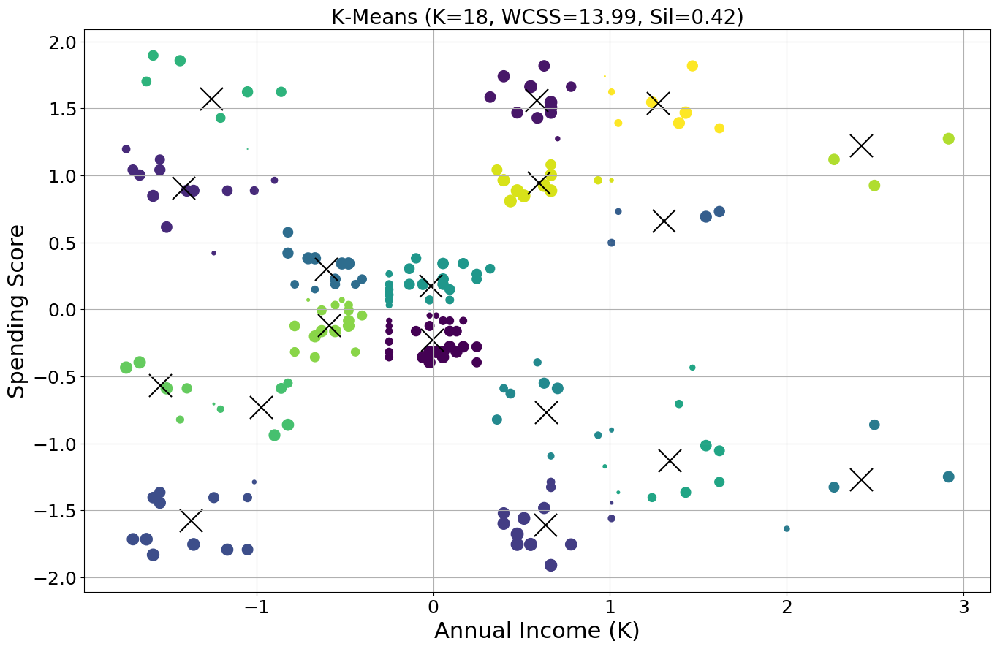

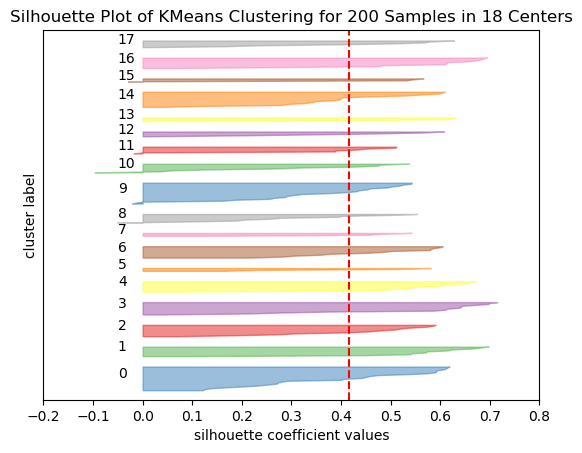

K=18, WCSS=13.99, Sil=0.42


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


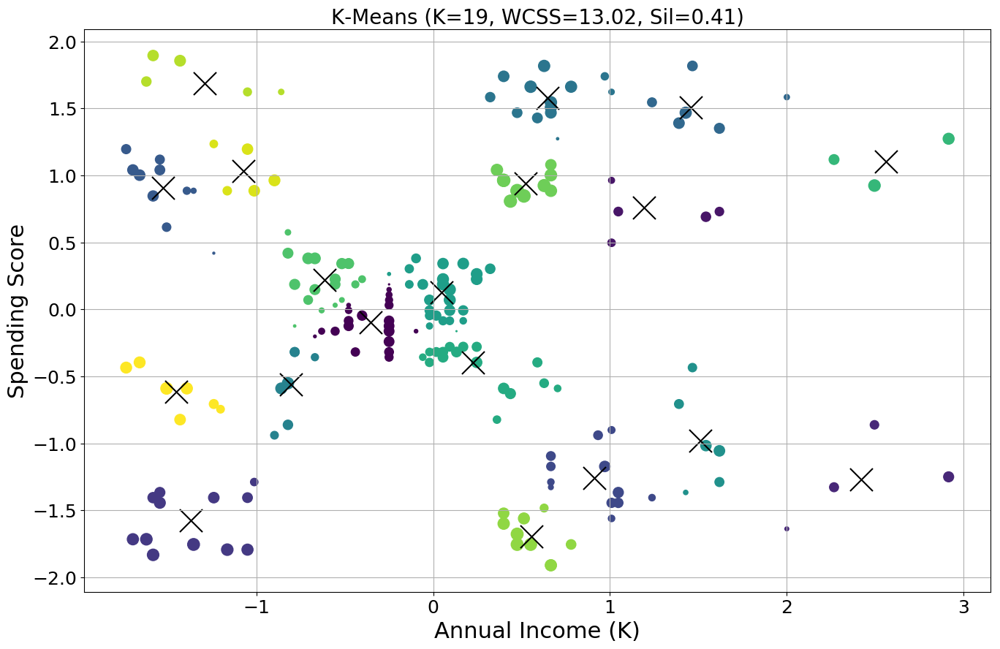

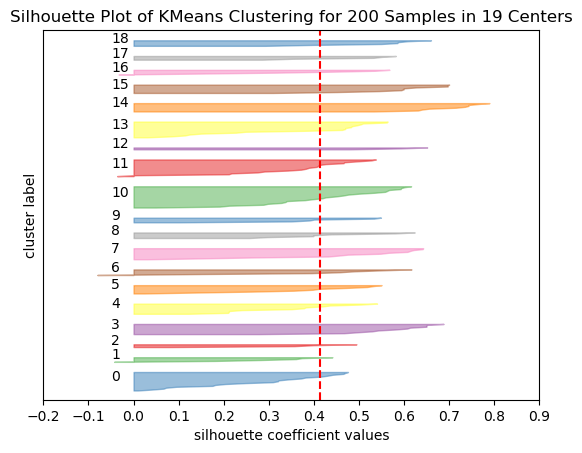

K=19, WCSS=13.02, Sil=0.41


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


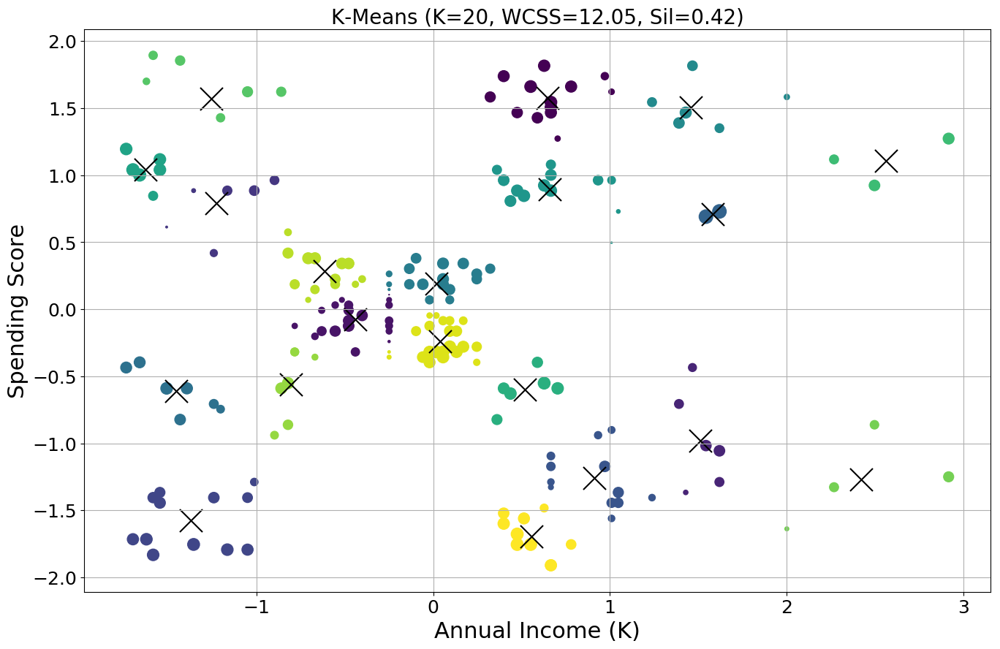

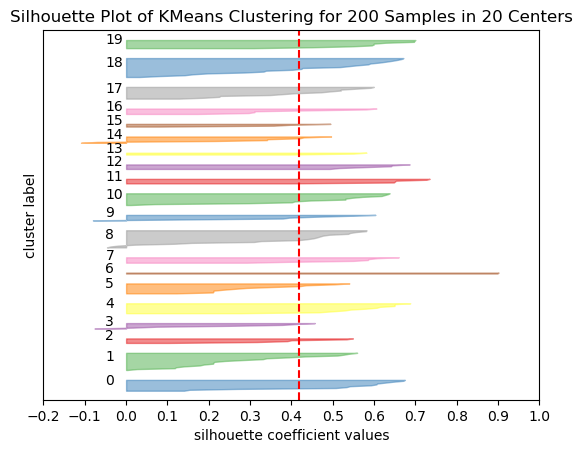

K=20, WCSS=12.05, Sil=0.42


In [26]:
def do_kmeans(X, k):
    k_means = KMeans(init='k-means++', n_clusters=k, n_init=10, random_state=42)
    k_means.fit(X)
    wcss = k_means.inertia_
    sil = silhouette_score(X, k_means.labels_)
    
    plt.style.use('default');

    sample_silhouette_values = silhouette_samples(X, k_means.labels_)
    sizes = 200*sample_silhouette_values

    plt.figure(figsize=(16, 10));
    plt.grid(True);

    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=sizes, c=k_means.labels_)
    plt.scatter(k_means.cluster_centers_[:, 0], k_means.cluster_centers_[:, 1], marker='x', s=500, c="black")

    plt.title("K-Means (K={}, WCSS={:.2f}, Sil={:.2f})".format(k, wcss, sil), fontsize=20);
    plt.xlabel('Annual Income (K)', fontsize=22);
    plt.ylabel('Spending Score', fontsize=22);
    plt.xticks(fontsize=18);
    plt.yticks(fontsize=18);
    plt.savefig('out/mall-kmeans-auto-{}-silhouette-size.png'.format(k));
    plt.show()
    
    
    visualizer = SilhouetteVisualizer(k_means)
    visualizer.fit(X)
    visualizer.poof()
    fig = visualizer.ax.get_figure()
    fig.savefig('out/mall-kmeans-auto-{}-silhouette-plot.png'.format(k), transparent=False);
    
    print("K={}, WCSS={:.2f}, Sil={:.2f}".format(k, wcss, sil))

for k in range(2, 21):
    do_kmeans(X, k)

# Look at Individual Silhouette Scores

In [27]:
k_means = KMeans(init='k-means++', n_clusters=7, n_init=10, random_state=42)
k_means.fit(X)
sample_silhouette_values = silhouette_samples(X, k_means.labels_)

X_tmp = X.copy()
X_tmp['Cluster ID'] = k_means.labels_

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=7, n_init=10, n_jobs=1, precompute_distances='auto',
    random_state=42, tol=0.0001, verbose=0)

In [28]:
X_tmp['Silhouette'] = sample_silhouette_values
X_tmp = X_tmp.sort_values(['Silhouette'])
X_tmp.head()
X_tmp.tail()

,AnnualIncome,SpendingScore,Cluster ID,Silhouette
179,1.238216,1.545098,1,-0.070888
42,-0.822933,-0.551266,3,-0.022478
142,0.589336,-0.395980,0,0.016976
45,-0.822933,0.574559,4,0.027658
126,0.398489,-0.590088,2,0.028098


,AnnualIncome,SpendingScore,Cluster ID,Silhouette
76,-0.250391,0.108700,0,0.733918
74,-0.250391,-0.124229,0,0.739517
78,-0.250391,0.069879,0,0.744169
77,-0.250391,-0.085407,0,0.748793
80,-0.250391,0.031057,0,0.751882


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\collections.py:874: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


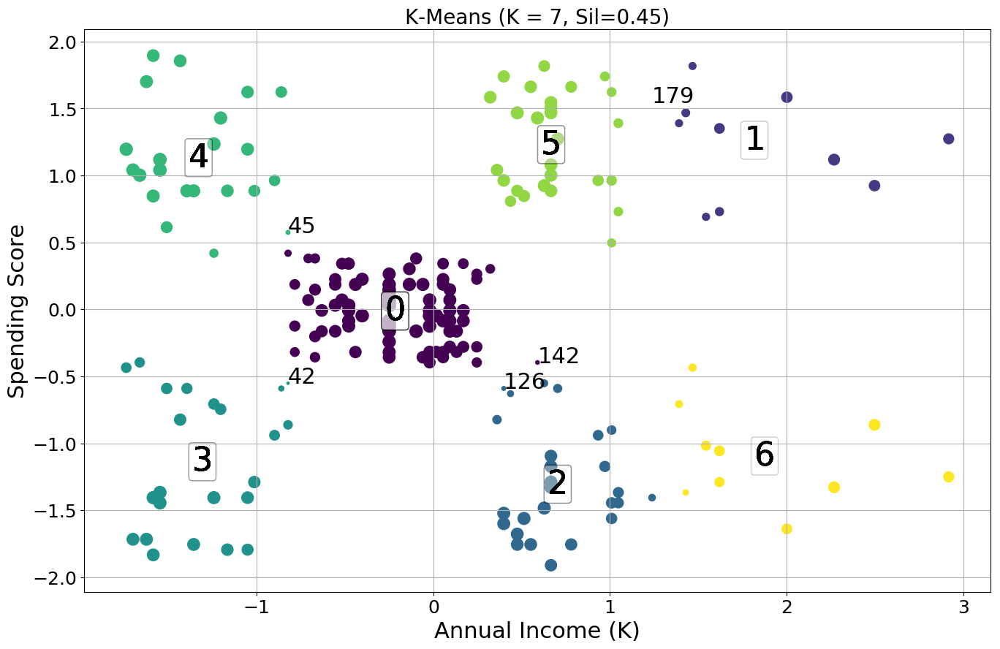

In [29]:
plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(X_tmp['AnnualIncome'], X_tmp['SpendingScore'], sizes=200*(X_tmp['Silhouette']+0.05), c=X_tmp['Cluster ID'])

plt.title("K-Means (K = {}, Sil={:.2f})".format(k_means.n_clusters, silhouette_score(X, kmeans.labels_, metric='euclidean')), fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);

for label in k_means.labels_:
    plt.text(x=k_means.cluster_centers_[label, 0], y=k_means.cluster_centers_[label, 1], s=label, fontsize=32, 
             horizontalalignment='center', verticalalignment='center', color='black',
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.1', alpha=0.02));
    
for i, txt in enumerate(X_tmp.index.values):
    sil = X_tmp['Silhouette'].iloc[i]
    if sil < 0.05:
        plt.text(x=X_tmp['AnnualIncome'].iloc[i], y=X_tmp['SpendingScore'].iloc[i], s=txt, fontsize=22)

plt.savefig('out/mall-kmeans-{}-silhouette-size-labels.png'.format(k_means.n_clusters));

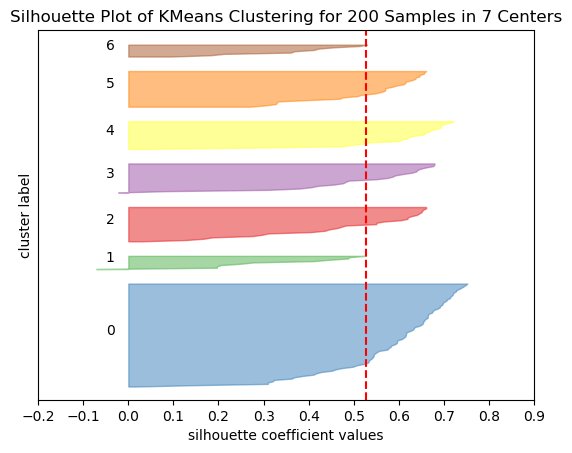

In [30]:
visualizer = SilhouetteVisualizer(k_means)
visualizer.fit(X)
visualizer.poof()
fig = visualizer.ax.get_figure()
fig.savefig('out/mall-kmeans-{}-silhouette-f.png'.format(k_means.n_clusters), transparent=False);

# DBSCAN

In [31]:
db = DBSCAN(eps=0.3, min_samples=2)
db.fit(X)

DBSCAN(algorithm='auto', eps=0.3, leaf_size=30, metric='euclidean',
    metric_params=None, min_samples=2, n_jobs=1, p=None)

In [32]:
db.labels_

array([ 0,  1,  2,  1,  0,  1,  2,  3,  2,  1,  2,  3,  2,  1,  2,  1,  0,
        1,  0,  3,  0,  1,  2,  1,  4,  1,  0, -1,  0,  1,  2,  1,  2,  1,
        4,  1,  4,  1,  5,  1,  5,  1,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,  5,
        5,  5,  5,  5,  6,  5,  6,  5,  6,  7,  6,  7,  6,  5,  6,  7,  6,
        7,  6,  7,  6,  7,  6,  5,  6,  7,  6,  5,  6,  7,  6,  7,  6,  7,
        6,  7,  6,  7,  6,  7,  6,  5,  6,  7,  6,  8,  6,  8,  6,  8,  6,
        8,  6,  8,  6,  8,  6,  8,  6,  8,  6,  9,  6,  8,  6,  9, -1,  8,
       10,  8,  6,  8, 10, -1, -1, -1, -1, -1, -1, -1, -1], dtype=int64)

In [33]:
silhouette_score(X, db.labels_)

0.3745966900645067

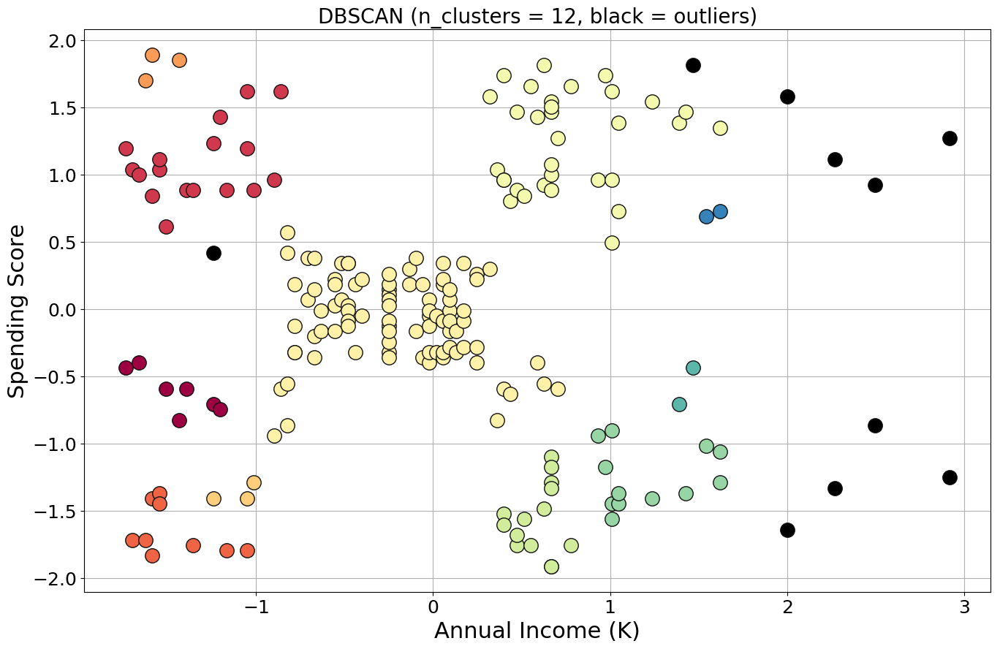

In [34]:
plt.figure(figsize=(16, 10));
plt.grid(True);

unique_labels = set(db.labels_)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))];

for k in unique_labels:
    if k == -1:        # Black used for noise.
        col = [0, 0, 0, 1]
    else:
        col = colors[k]

    xy = X[db.labels_ == k]
    plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14);

    
plt.title('');
plt.title("DBSCAN (n_clusters = {:d}, black = outliers)".format(len(unique_labels)), fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);
plt.savefig('out/mall-dbscan-03.png', transparent=False);

## Elbow Method

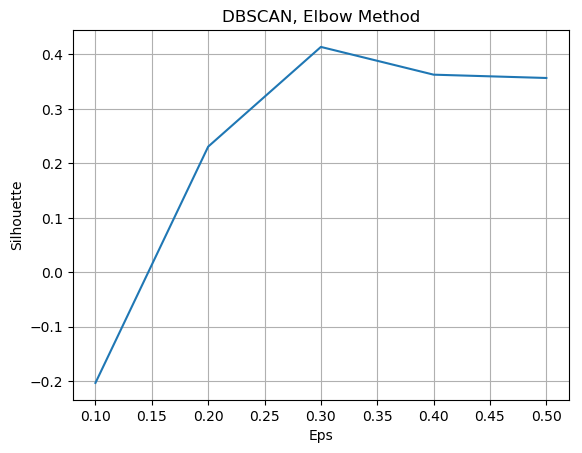

In [35]:
silhouettes = {}
for eps in np.arange(0.1, 0.6, 0.1):
    db = DBSCAN(eps=eps, min_samples=3).fit(X)
    silhouettes[eps] = silhouette_score(X, db.labels_, metric='euclidean')
    

plt.figure();
plt.plot(list(silhouettes.keys()), list(silhouettes.values()));
plt.title('DBSCAN, Elbow Method')
plt.xlabel("Eps");
plt.ylabel("Silhouette");
plt.grid(True);
plt.savefig('out/mall-dbscan-03-silhouette.png', transparent=False);

## Parameter Exploration

eps=0.1, min_samples=1, n_clusters=110, sil=0.30034080305381233
eps=0.1, min_samples=2, n_clusters=40, sil=0.0660876788435225
eps=0.1, min_samples=3, n_clusters=15, sil=-0.20308391205535767
eps=0.1, min_samples=4, n_clusters=8, sil=-0.27565539274724876
eps=0.1, min_samples=5, n_clusters=5, sil=-0.2700934604293137
eps=0.1, min_samples=6, n_clusters=4, sil=-0.301443775619125
eps=0.1, min_samples=7, n_clusters=3, sil=-0.28431740706316444
eps=0.1, min_samples=8, n_clusters <= 1. Returning.
eps=0.1, min_samples=9, n_clusters <= 1. Returning.
eps=0.2, min_samples=1, n_clusters=46, sil=0.2303172836524675
eps=0.2, min_samples=2, n_clusters=25, sil=0.20606104897946675
eps=0.2, min_samples=3, n_clusters=14, sil=0.23058471130629898
eps=0.2, min_samples=4, n_clusters=6, sil=0.19685111632552818
eps=0.2, min_samples=5, n_clusters=8, sil=0.14057942679617558
eps=0.2, min_samples=6, n_clusters=5, sil=0.09644483815713828
eps=0.2, min_samples=7, n_clusters=5, sil=0.05559332249286136
eps=0.2, min_samples=

C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.3, min_samples=6, n_clusters=7, sil=0.24983531622925184


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.3, min_samples=7, n_clusters=5, sil=0.23146493255355374


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.3, min_samples=8, n_clusters=6, sil=0.19432071085905328


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.3, min_samples=9, n_clusters=5, sil=0.1460941923615792
eps=0.4, min_samples=1, n_clusters=12, sil=0.28742025766331464


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=2, n_clusters=7, sil=0.32219422583342383


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=3, n_clusters=5, sil=0.3626911889159071


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=4, n_clusters=4, sil=0.39828449401818633


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=5, n_clusters=5, sil=0.41325830390002166


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=6, n_clusters=5, sil=0.4042821432758869


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=7, n_clusters=5, sil=0.4043035202447902


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=8, n_clusters=6, sil=0.4148124800517594


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.4, min_samples=9, n_clusters=5, sil=0.3448055213289852


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=1, n_clusters=7, sil=0.2681328893586485


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=2, n_clusters=5, sil=0.26638945791893887
eps=0.5, min_samples=3, n_clusters=3, sil=0.3566017629129311


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=4, n_clusters=3, sil=0.35044619989666004


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=5, n_clusters=3, sil=0.35044619989666004


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=6, n_clusters=3, sil=0.3597246686657918


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=7, n_clusters=3, sil=0.35261506078723714


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=8, n_clusters=3, sil=0.3471977366353613


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.5, min_samples=9, n_clusters=4, sil=0.31732880330547364


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.6, min_samples=1, n_clusters <= 1. Returning.
eps=0.6, min_samples=2, n_clusters <= 1. Returning.
eps=0.6, min_samples=3, n_clusters <= 1. Returning.
eps=0.6, min_samples=4, n_clusters=2, sil=0.42136463110237615


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.6, min_samples=5, n_clusters=2, sil=0.42136463110237615


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.6, min_samples=6, n_clusters=2, sil=0.4184670145377363


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.6, min_samples=7, n_clusters=2, sil=0.4184670145377363


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


eps=0.6, min_samples=8, n_clusters=2, sil=0.4184670145377363
eps=0.6, min_samples=9, n_clusters=2, sil=0.41462162425790006


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


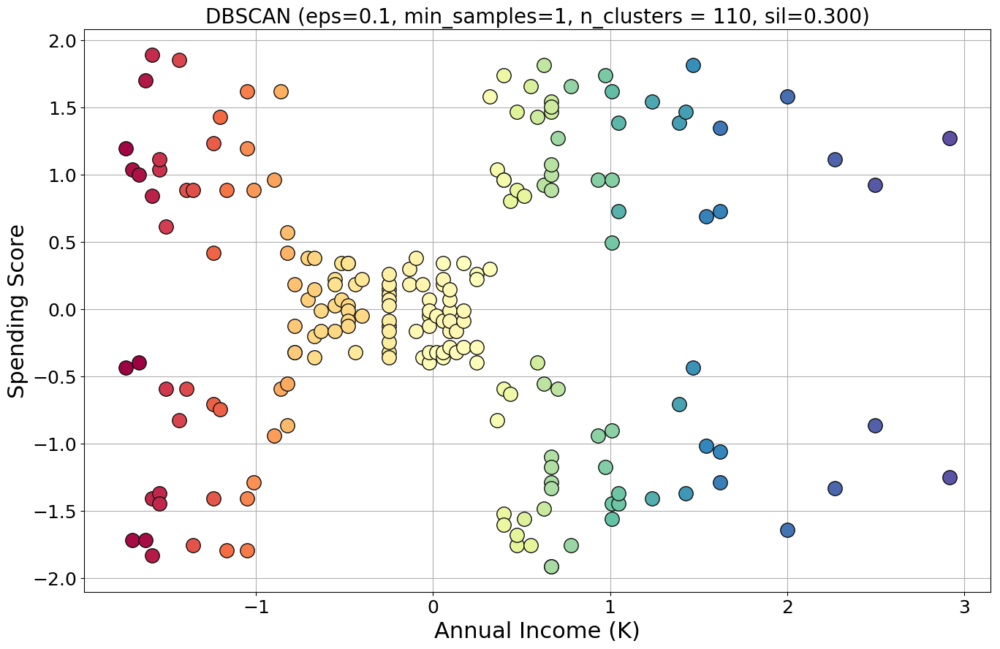

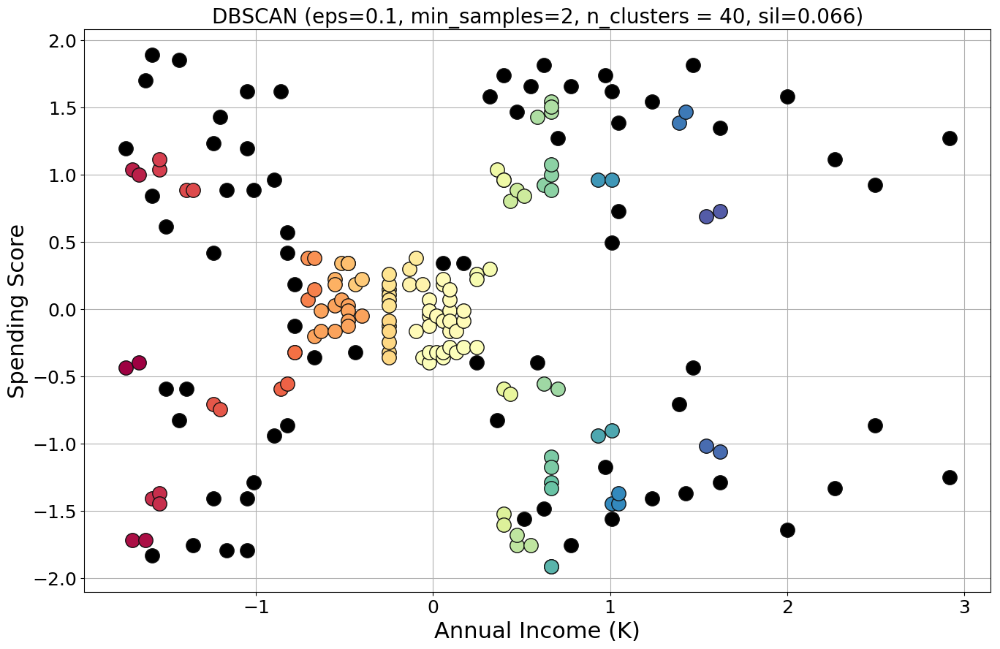

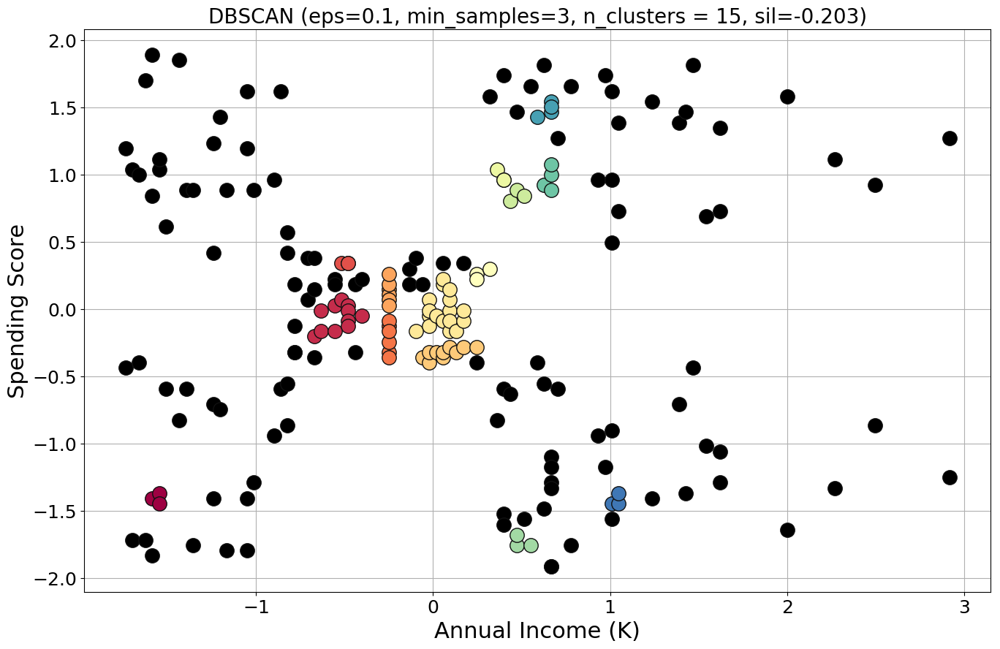

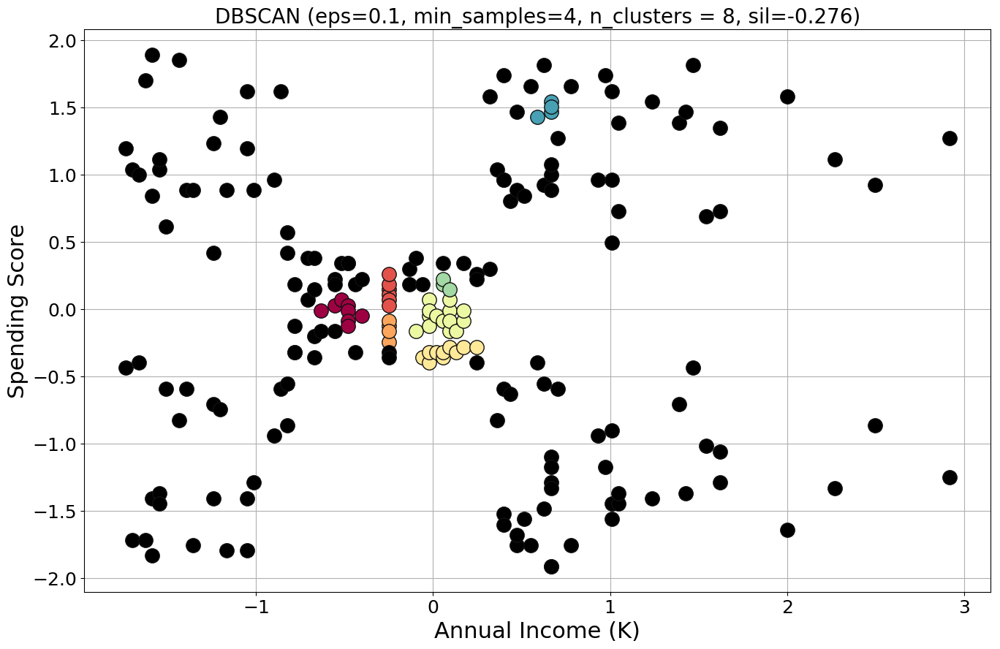

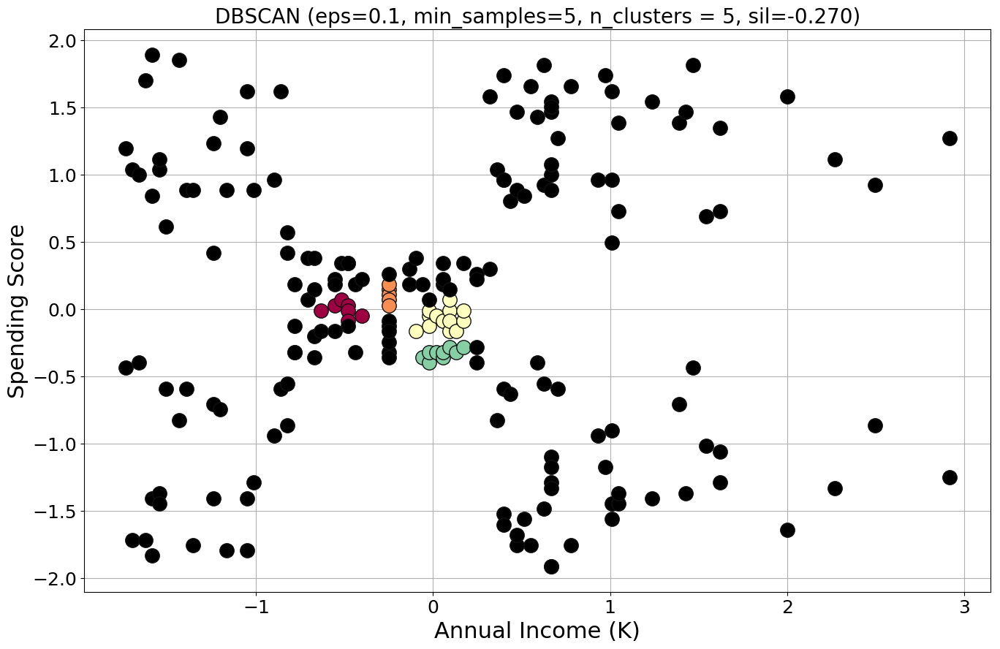

...

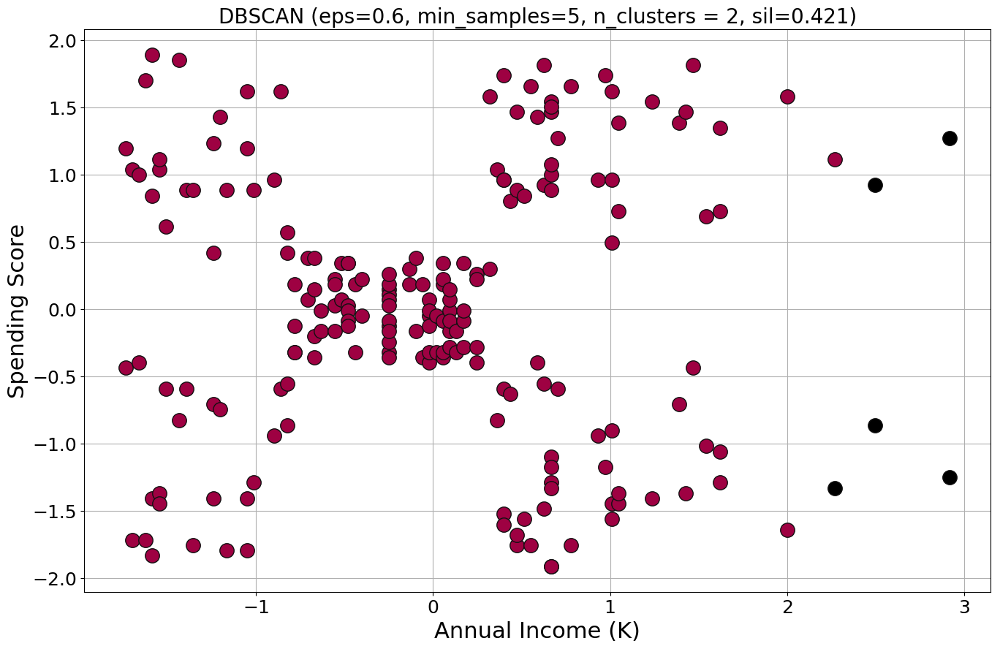

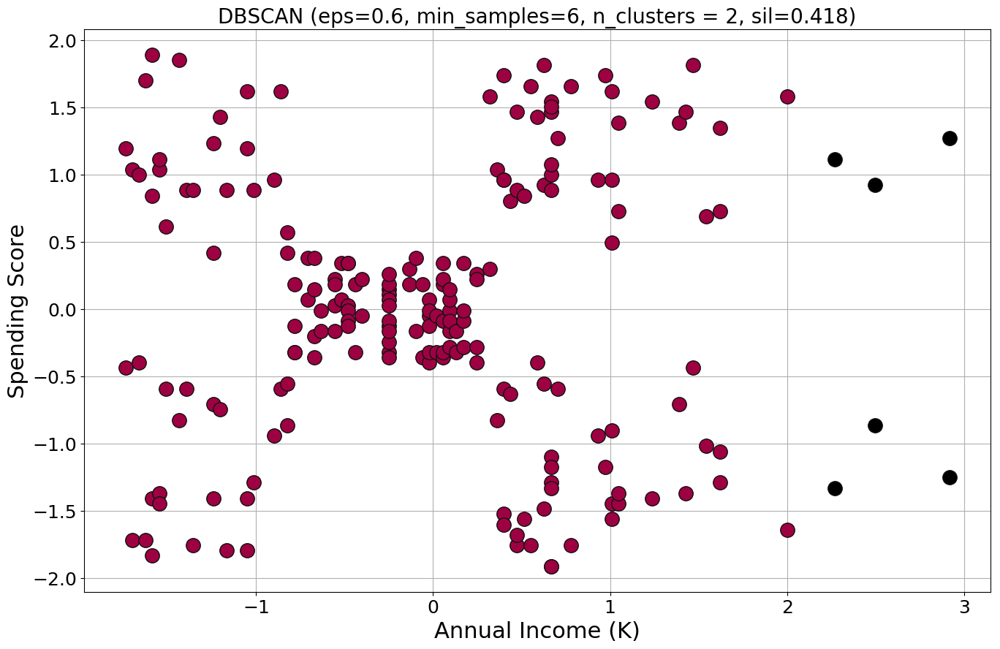

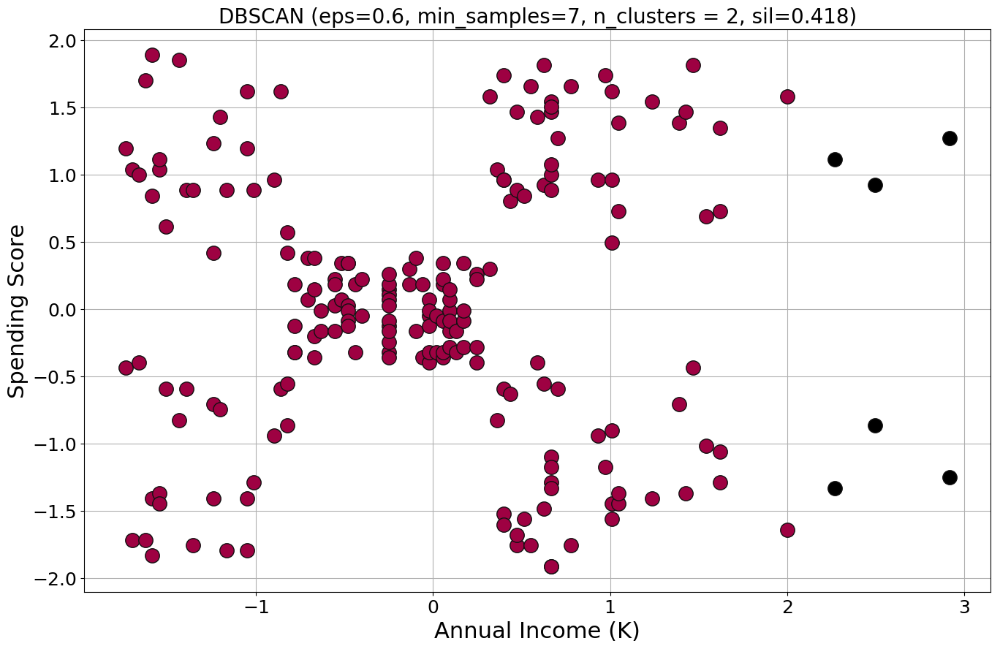

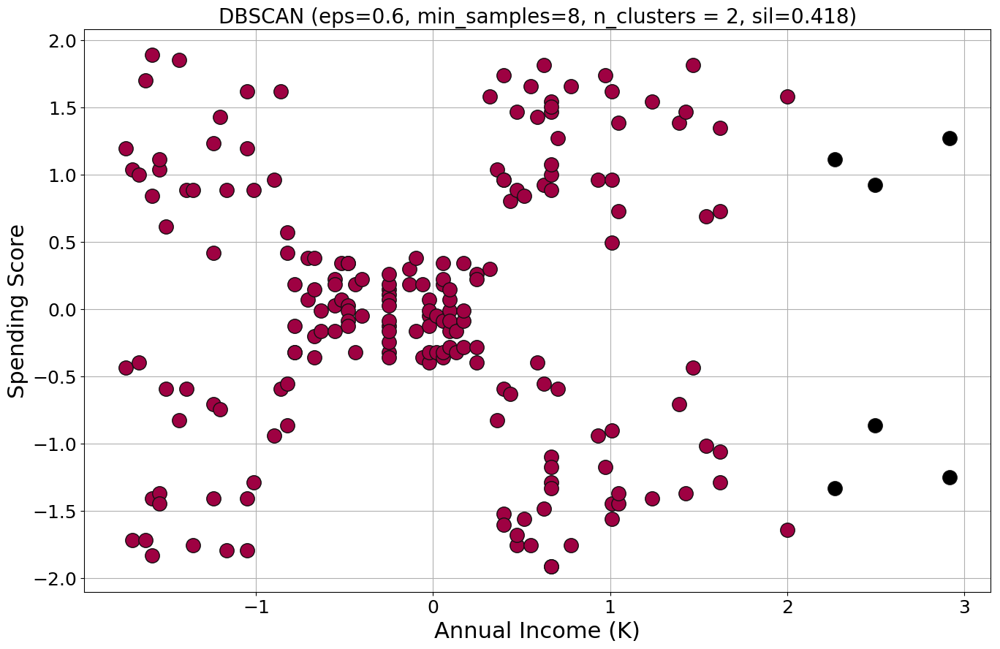

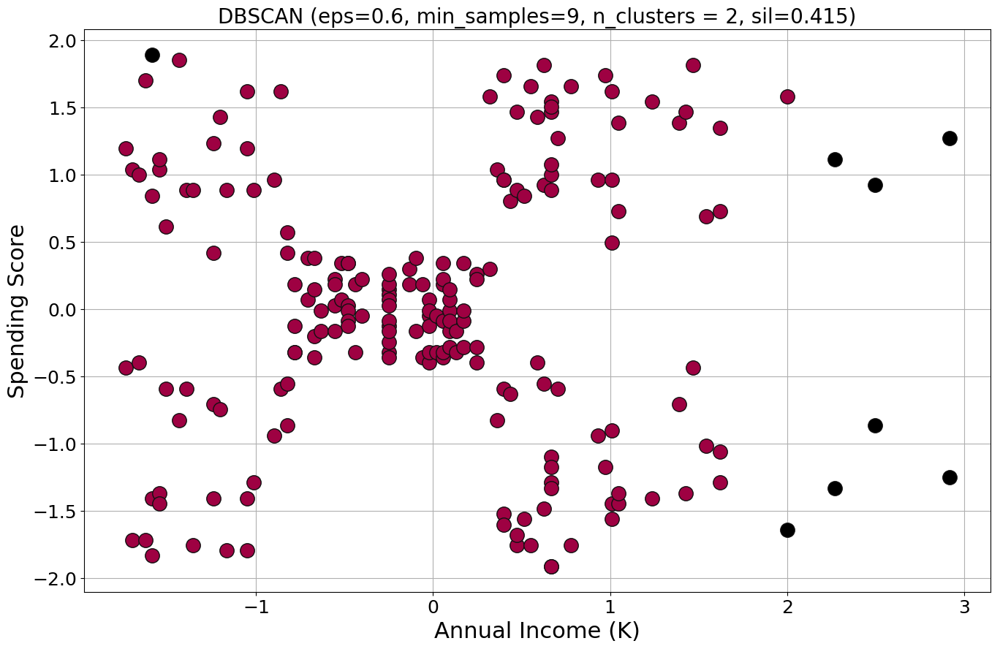

In [36]:
def do_dbscan(X, eps, min_samples):
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(X)

    unique_labels = set(db.labels_)
    n_clusters = len(unique_labels)
    
    if n_clusters <= 1:
        print('eps={}, min_samples={}, n_clusters <= 1. Returning.'.format(eps, min_samples))
        return
    
    sil = silhouette_score(X, db.labels_)
    print("eps={}, min_samples={}, n_clusters={}, sil={}".format(eps, min_samples, n_clusters, sil))
    
    plt.figure(figsize=(16, 10));
    plt.grid(True);   
    
    colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))];

    for k in unique_labels:
        if k == -1:        # Black used for noise.
            col = [0, 0, 0, 1]
        else:
            col = colors[k]

        xy = X[db.labels_ == k]
        plt.plot(xy.iloc[:, 0], xy.iloc[:, 1], 'o', markerfacecolor=tuple(col), markeredgecolor='k', markersize=14);


    plt.title('');
    plt.title("DBSCAN (eps={}, min_samples={}, n_clusters = {:d}, sil={:.3f})".format(eps, min_samples, n_clusters, sil), fontsize=20);
    plt.xlabel('Annual Income (K)', fontsize=22);
    plt.ylabel('Spending Score', fontsize=22);
    plt.xticks(fontsize=18);
    plt.yticks(fontsize=18);
    plt.savefig('out/mall-dbscan-auto-{}-{}.png'.format(eps, min_samples), transparent=False);
    

epss = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]
min_samples = range(1, 10)

for prod in list(itertools.product(epss, min_samples)):
    do_dbscan(X, prod[0], prod[1])

# Hierarchical (Agglomerative)

In [37]:
agg = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
agg.fit(X)

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
            connectivity=None, linkage='ward', memory=None, n_clusters=5,
            pooling_func=<function mean at 0x00000225B6A126A8>)

In [38]:
agg.labels_

array([4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3,
       4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 3, 4, 2,
       4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 1, 2, 1, 0, 1, 0, 1,
       2, 1, 0, 1, 0, 1, 0, 1, 0, 1, 2, 1, 0, 1, 2, 1, 0, 1, 0, 1, 0, 1,
       0, 1, 0, 1, 0, 1, 2, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1,
       0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1,
       0, 1], dtype=int64)

In [39]:
silhouette_score(X, agg.labels_)

0.5538089226688662

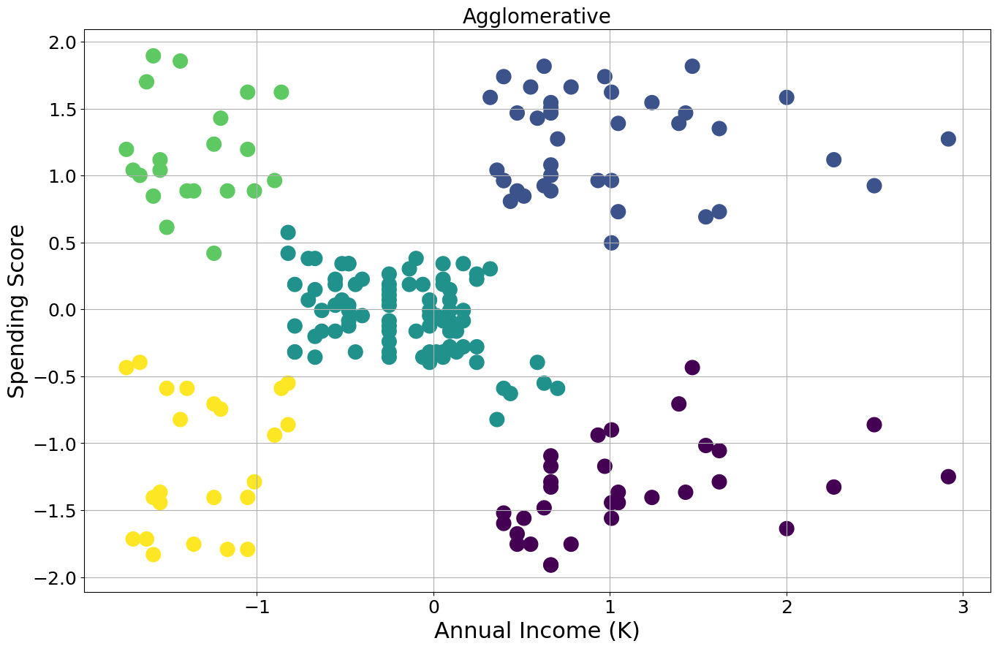

In [40]:
plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=200, c=agg.labels_);
plt.title("Agglomerative", fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);
plt.savefig('out/mall-agg-5.png', transparent=False);

## Dendograms, Linkages, and Distance Metrics

Note that scikit learn does not itself currently support plotting dendograms. Instead, we'll use SciPy's `cluster.hierarchy` module to re-do the clustering, and plot the dendogram.

## Distance Metrics

Linkage=complete, Metric=euclidean, Clusters=5, Silhouette=0.553
Linkage=complete, Metric=minkowski, Clusters=5, Silhouette=0.553
Linkage=complete, Metric=cityblock, Clusters=5, Silhouette=0.566
Linkage=complete, Metric=cosine, Clusters=5, Silhouette=0.766


C:\Users\st50\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\cluster\unsupervised.py:205: RuntimeWarning: invalid value encountered in true_divide
  sil_samples /= np.maximum(intra_clust_dists, inter_clust_dists)


Linkage=complete, Metric=correlation, Clusters=3, Silhouette=nan
Linkage=complete, Metric=chebyshev, Clusters=5, Silhouette=0.456
Linkage=complete, Metric=canberra, Clusters=5, Silhouette=0.258
Linkage=complete, Metric=mahalanobis, Clusters=5, Silhouette=0.553
Linkage=ward, Metric=euclidean, Clusters=5, Silhouette=0.554
Linkage=single, Metric=euclidean, Clusters=5, Silhouette=0.276
Linkage=single, Metric=minkowski, Clusters=5, Silhouette=0.276


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=single, Metric=cityblock, Clusters=5, Silhouette=0.222


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=single, Metric=cosine, Clusters=5, Silhouette=0.573


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=single, Metric=correlation, Clusters=2, Silhouette=1.0


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=single, Metric=chebyshev, Clusters=5, Silhouette=0.272


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=single, Metric=canberra, Clusters=5, Silhouette=0.332


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=single, Metric=mahalanobis, Clusters=5, Silhouette=0.265


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=centroid, Metric=euclidean, Clusters=5, Silhouette=0.479


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=euclidean, Clusters=5, Silhouette=0.479


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=minkowski, Clusters=5, Silhouette=0.479


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=cityblock, Clusters=5, Silhouette=0.577


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=cosine, Clusters=5, Silhouette=0.75


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\st50\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\metrics\cluster\unsupervised.py:205: RuntimeWarning: invalid value encountered in true_divide
  sil_samples /= np.maximum(intra_clust_dists, inter_clust_dists)


Linkage=average, Metric=correlation, Clusters=5, Silhouette=nan


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=chebyshev, Clusters=5, Silhouette=0.48


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=canberra, Clusters=5, Silhouette=0.338


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Linkage=average, Metric=mahalanobis, Clusters=5, Silhouette=0.481


C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


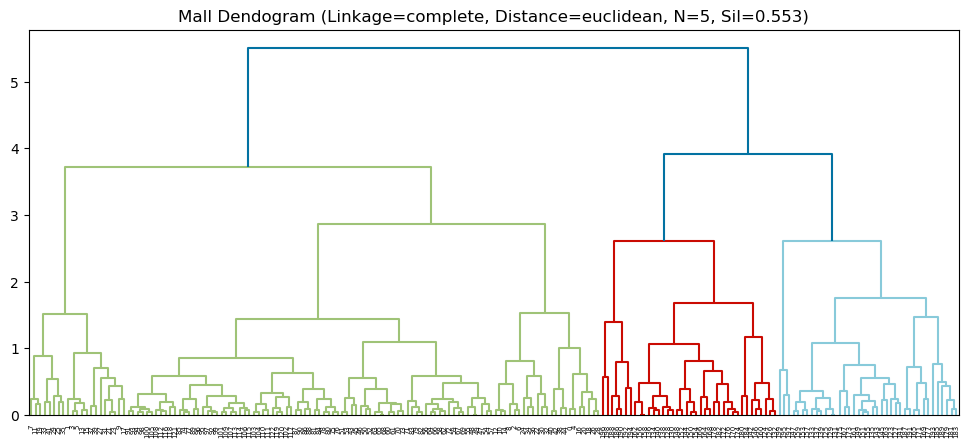

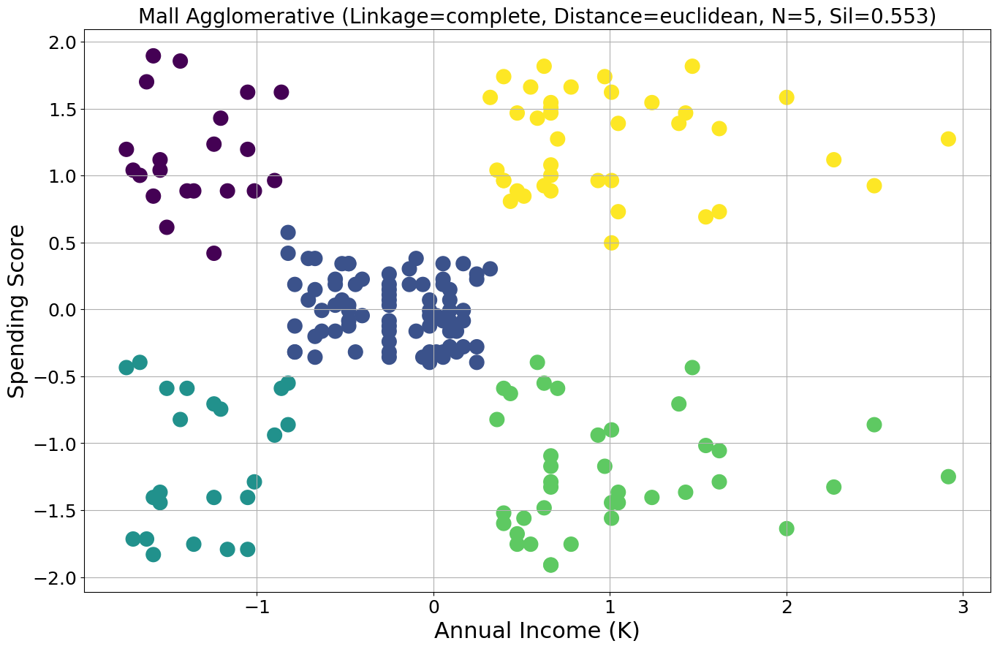

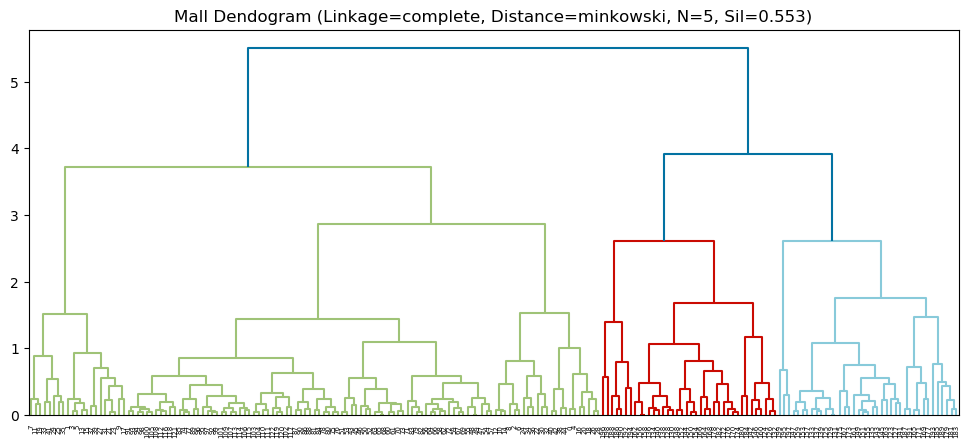

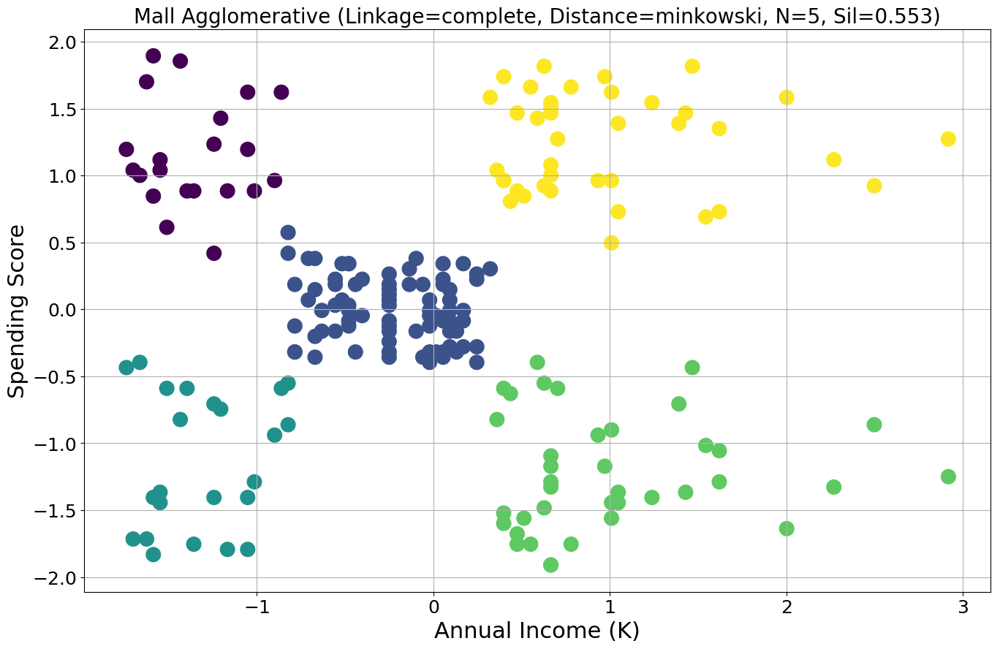

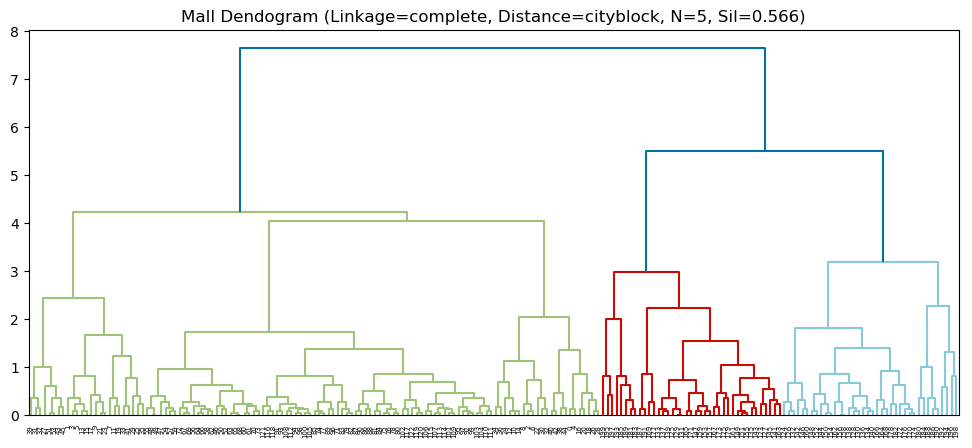

...

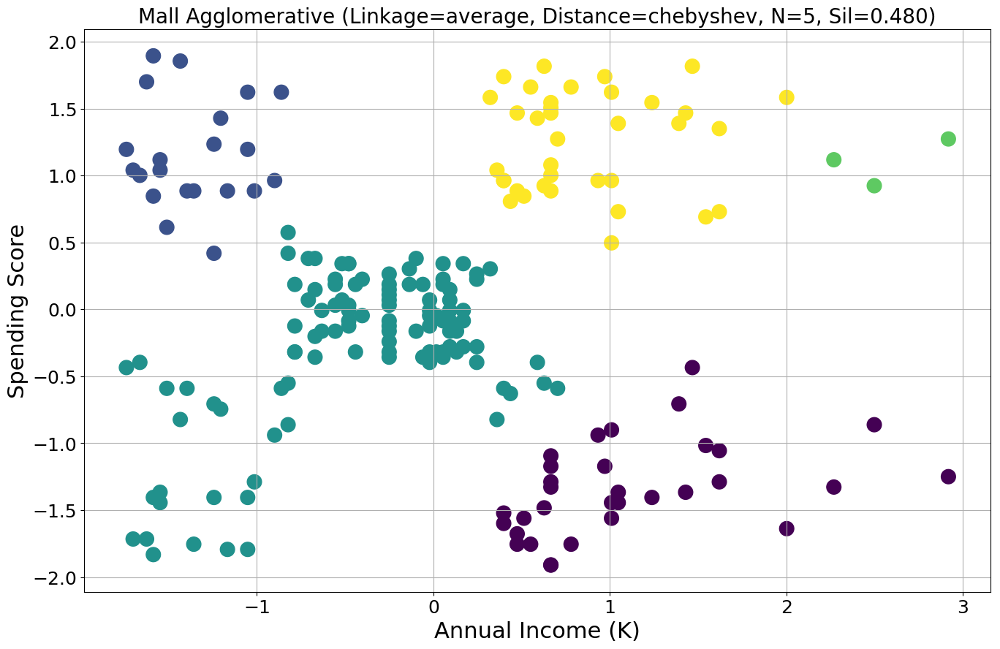

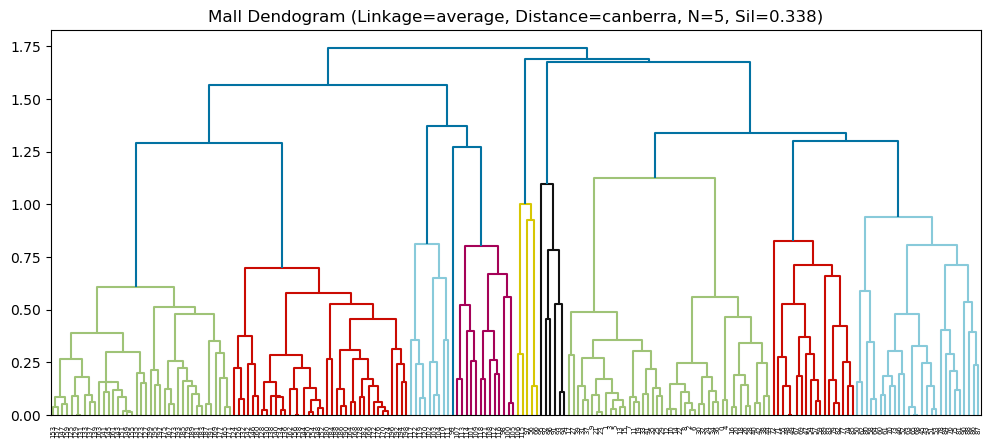

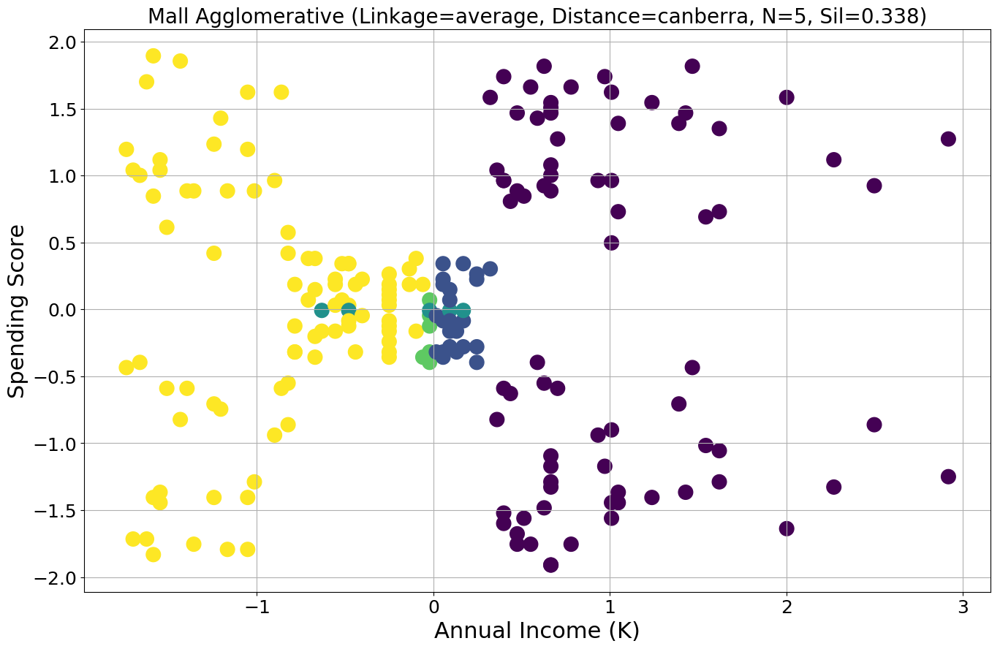

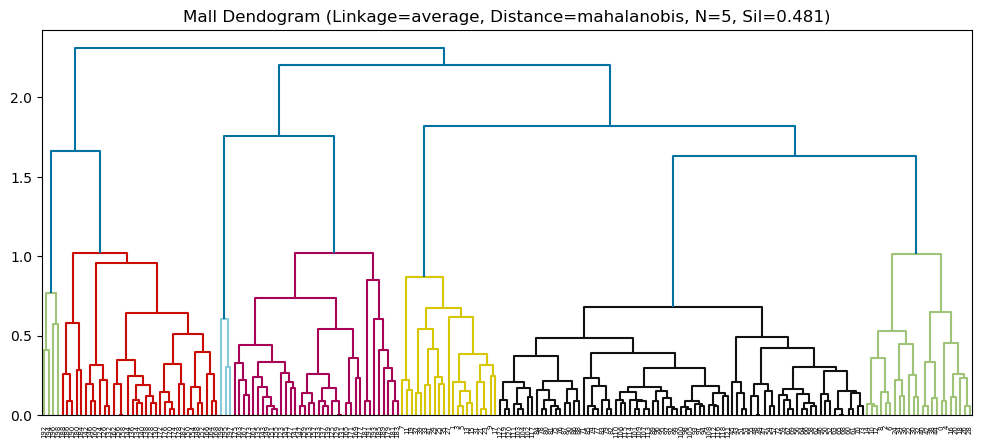

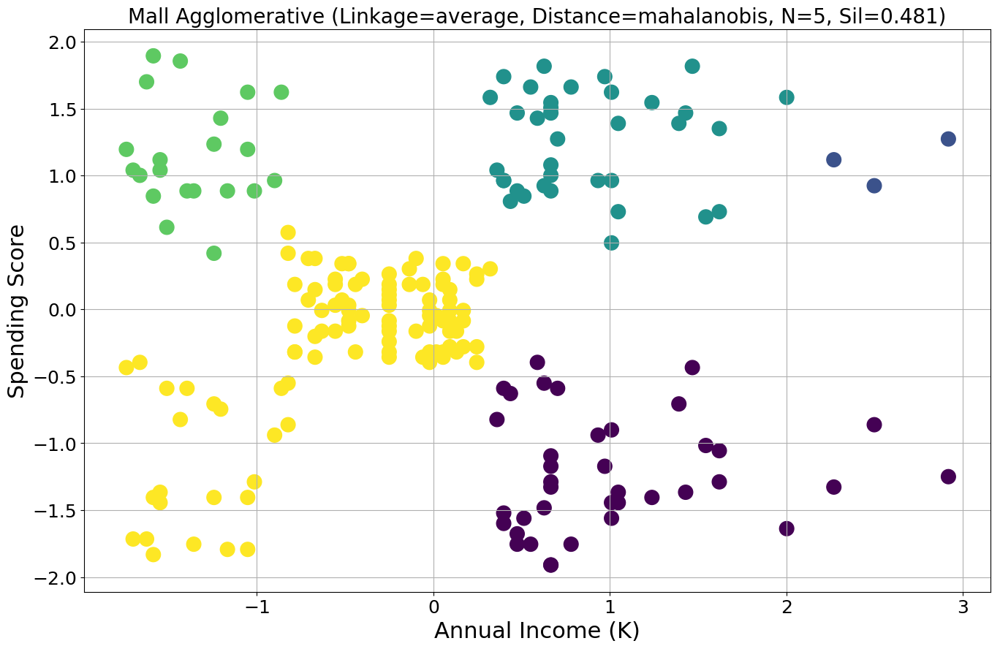

In [41]:
def plot_agg(X, linkage, metric):
    aggl = scipy.cluster.hierarchy.linkage(X, method=linkage, metric=metric)
    
    labels = scipy.cluster.hierarchy.fcluster(aggl, 5, criterion="maxclust")
    
    sil = 0
    n = len(set(labels))
    if n > 1:
        sil = silhouette_score(X , labels, metric=metric)
    print("Linkage={}, Metric={}, Clusters={}, Silhouette={:.3}".format(linkage, metric, n, sil))
    
    # Plot the dendogram
    plt.figure(figsize=(12, 5))  
    plt.title("Mall Dendogram (Linkage={}, Distance={}, N={}, Sil={:.3f})".format(linkage, metric, n, sil))  
    dend = scipy.cluster.hierarchy.dendrogram(aggl) 
    plt.savefig('out/mall-agg-5-auto-dendogram-{}-{}.png'.format(linkage, metric), transparent=False);
    
    
    # Plot the points
    plt.style.use('default');
    plt.figure(figsize=(16, 10));
    plt.grid(True);

    plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=200, c=labels);
    plt.title("Mall Agglomerative (Linkage={}, Distance={}, N={}, Sil={:.3f})".format(linkage, metric, n, sil), fontsize=20);
    plt.xlabel('Annual Income (K)', fontsize=22);
    plt.ylabel('Spending Score', fontsize=22);
    plt.xticks(fontsize=18);
    plt.yticks(fontsize=18);
    plt.savefig('out/mall-agg-5-auto--{}-{}.png'.format(linkage, metric), transparent=False);

    
linkages = ['complete', 'ward', 'single', 'centroid', 'average']
metrics = ['euclidean', 'minkowski', 'cityblock', 'cosine', 'correlation', 'chebyshev', 'canberra', 'mahalanobis']

for prod in list(itertools.product(linkages, metrics)):
    
    # Some combos are not allowed
    if (prod[0] in ['ward', 'centroid']) and prod[1] != 'euclidean':
        continue
        
    plot_agg(X, prod[0], prod[1])

# Gaussian Mixture Models (GMM)

In [42]:
gmm = GaussianMixture(n_components=5, covariance_type='full').fit(X)

labels = gmm.predict(X)
silhouette_score(X, labels)

0.5536892843811245

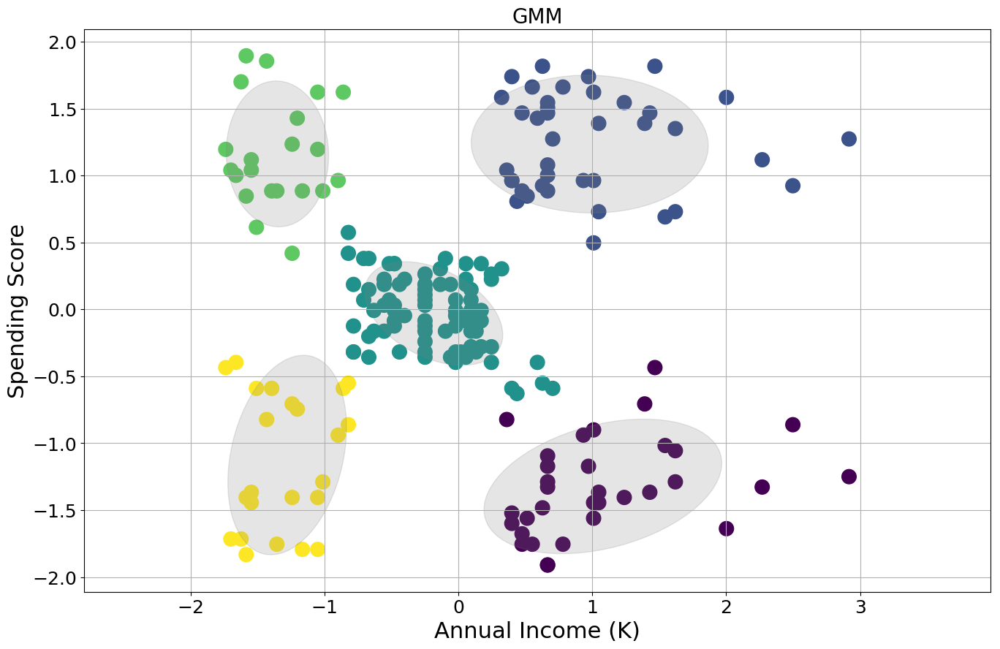

In [43]:
# From:
# https://scikit-learn.org/stable/auto_examples/mixture/plot_gmm_covariances.html
def make_ellipses(gmm, ax):
    for n, label in enumerate(set(labels)):
        if gmm.covariance_type == 'full':
            covariances = gmm.covariances_[n][:2, :2]
        elif gmm.covariance_type == 'tied':
            covariances = gmm.covariances_[:2, :2]
        elif gmm.covariance_type == 'diag':
            covariances = np.diag(gmm.covariances_[n][:2])
        elif gmm.covariance_type == 'spherical':
            covariances = np.eye(gmm.means_.shape[1]) * gmm.covariances_[n]
        v, w = np.linalg.eigh(covariances)
        u = w[0] / np.linalg.norm(w[0])
        angle = np.arctan2(u[1], u[0])
        angle = 180 * angle / np.pi  # convert to degrees
        v = 2. * np.sqrt(2.) * np.sqrt(v)
        ell = mpl.patches.Ellipse(gmm.means_[n, :2], v[0], v[1],
                                  180 + angle, color='grey')
        ell.set_clip_box(ax.bbox)
        ell.set_alpha(0.2)
        ax.add_artist(ell)
        ax.set_aspect('equal', 'datalim')


plt.style.use('default');

plt.figure(figsize=(16, 10));
plt.grid(True);

plt.scatter(X.iloc[:, 0], X.iloc[:, 1], s=200, c=labels);
make_ellipses(gmm, plt.gca())
plt.title("GMM", fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);
plt.savefig('out/mall-gmm-5.png', transparent=False);

# Categorical Data

How do we deal with categorical data? Standard K-Means and Standard Euclidean distance don't work. 

We have a number of options:

- Create dummy variables
- Run PCA first
- Use a categorical-aware distance metric, like Gower
- Use a categorical-aware algorithm, like k-mediods/k-modes

In [44]:
scaler = StandardScaler()

X1 = df.copy()

# Create bins of Age
X1['AgeBin'] = pd.cut(X1['Age'], [0, 30, 55, 100])
X1 = X1.drop(['CustomerID', 'Age'], axis=1)

features = ['AnnualIncome', 'SpendingScore']
X1[features] = scaler.fit_transform(X1[features])

X1.info()
X1.describe().transpose()
X1.head(n=20)

<class 'pandas.core.frame.DataFrame'>
Index: 200 entries, 0 to 199
Data columns (total 4 columns):
Male             200 non-null bool
AnnualIncome     200 non-null float64
SpendingScore    200 non-null float64
AgeBin           200 non-null category
dtypes: bool(1), category(1), float64(2)
memory usage: 5.1+ KB


,count,mean,std,min,25%,50%,75%,max
AnnualIncome,200.0,-6.128431e-16,1.002509,-1.738999,-0.727509,0.035879,0.665675,2.917671
SpendingScore,200.0,-1.121325e-16,1.002509,-1.910021,-0.599793,-0.007764,0.885132,1.894492


,Male,AnnualIncome,SpendingScore,AgeBin
0,True,-1.738999,-0.434801,"(0, 30]"
1,True,-1.738999,1.195704,"(0, 30]"
2,False,-1.700830,-1.715913,"(0, 30]"
3,False,-1.700830,1.040418,"(0, 30]"
4,False,-1.662660,-0.395980,"(30, 55]"
5,False,-1.662660,1.001596,"(0, 30]"
6,False,-1.624491,-1.715913,"(30, 55]"
7,False,-1.624491,1.700384,"(0, 30]"
8,True,-1.586321,-1.832378,"(55, 100]"
9,False,-1.586321,0.846310,"(0, 30]"


# Create Dummy Variables

In [45]:
# TODO

## Running PCA First

In [46]:
# TODO

# Gower Distance

Unfortunately, and strangely, sci-kit learn doesn't yet have an implementation of the Gower distance metric. And I coldn't find any package that did. However, I did find some random guy's code that implemented the metric, and it seems to work well. Kudos to him!

In [47]:
# From: https://sourceforge.net/projects/gower-distance-4python/

import numpy as np
import pandas as pd
from scipy.spatial import distance 
from sklearn.utils import validation
from sklearn.metrics import pairwise
from scipy.sparse import issparse


def check_pairwise_arrays(X, Y, precomputed=False, dtype=None):
    X, Y, dtype_float = pairwise._return_float_dtype(X, Y)

    warn_on_dtype = dtype is not None
    estimator = 'check_pairwise_arrays'
    if dtype is None:
        dtype = dtype_float

    if Y is X or Y is None:
        X = Y = validation.check_array(X, accept_sparse='csr', dtype=dtype,
                            warn_on_dtype=warn_on_dtype, estimator=estimator)
    else:
        X = validation.check_array(X, accept_sparse='csr', dtype=dtype,
                        warn_on_dtype=warn_on_dtype, estimator=estimator)
        Y = validation.check_array(Y, accept_sparse='csr', dtype=dtype,
                        warn_on_dtype=warn_on_dtype, estimator=estimator)

    if precomputed:
        if X.shape[1] != Y.shape[0]:
            raise ValueError("Precomputed metric requires shape "
                             "(n_queries, n_indexed). Got (%d, %d) "
                             "for %d indexed." %
                             (X.shape[0], X.shape[1], Y.shape[0]))
    elif X.shape[1] != Y.shape[1]:
        raise ValueError("Incompatible dimension for X and Y matrices: "
                         "X.shape[1] == %d while Y.shape[1] == %d" % (
                             X.shape[1], Y.shape[1]))

    return X, Y


# Vectorized Version
def gower_distances(X, Y=None, feature_weight=None, categorical_features=None):
    """Computes the gower distances between X and Y

    Gower is a similarity measure for categorical, boolean and numerical mixed
    data.

    
    Parameters
    ----------
    X : array-like, or pandas.DataFrame, shape (n_samples, n_features)

    Y : array-like, or pandas.DataFrame, shape (n_samples, n_features)

    feature_weight :  array-like, shape (n_features)
        According the Gower formula, feature_weight is an attribute weight.

    categorical_features: array-like, shape (n_features)
        Indicates with True/False whether a column is a categorical attribute.
        This is useful when categorical atributes are represented as integer
        values. Categorical ordinal attributes are treated as numeric, and must
        be marked as false.
        
        Alternatively, the categorical_features array can be represented only
        with the numerical indexes of the categorical attribtes.

    Returns
    -------
    similarities : ndarray, shape (n_samples, n_samples)

    Notes
    ------
    The non-numeric features, and numeric feature ranges are determined from X and not Y.
    No support for sparse matrices.

    """
    
    if issparse(X) or issparse(Y):
        raise TypeError("Sparse matrices are not supported for gower distance")
        
    y_none = Y is None
    
    
    # It is necessary to convert to ndarray in advance to define the dtype
    if not isinstance(X, np.ndarray):
        X = np.asarray(X)

    array_type = np.object
    # this is necessary as strangelly the validator is rejecting numeric
    # arrays with NaN
    if  np.issubdtype(X.dtype, np.number) and (np.isfinite(X.sum()) or np.isfinite(X).all()):
        array_type = type(np.zeros(1,X.dtype).flat[0])
    
    X, Y = check_pairwise_arrays(X, Y, precomputed=False, dtype=array_type)
    
    n_rows, n_cols = X.shape
    
    if categorical_features is None:
        categorical_features = np.zeros(n_cols, dtype=bool)
        for col in range(n_cols):
            # In numerical columns, None is converted to NaN,
            # and the type of NaN is recognized as a number subtype
            if not np.issubdtype(type(X[0, col]), np.number):
                categorical_features[col]=True
    else:          
        categorical_features = np.array(categorical_features)
    
    
    #if categorical_features.dtype == np.int32:
    if np.issubdtype(categorical_features.dtype, np.int):
        new_categorical_features = np.zeros(n_cols, dtype=bool)
        new_categorical_features[categorical_features] = True
        categorical_features = new_categorical_features
    
    print(categorical_features)
  
    # Categorical columns
    X_cat =  X[:,categorical_features]
    
    # Numerical columns
    X_num = X[:,np.logical_not(categorical_features)]
    ranges_of_numeric = None
    max_of_numeric = None
    
        
    # Calculates the normalized ranges and max values of numeric values
    _ ,num_cols=X_num.shape
    ranges_of_numeric = np.zeros(num_cols)
    max_of_numeric = np.zeros(num_cols)
    for col in range(num_cols):
        col_array = X_num[:, col].astype(np.float32) 
        max = np.nanmax(col_array)
        min = np.nanmin(col_array)
     
        if np.isnan(max):
            max = 0.0
        if np.isnan(min):
            min = 0.0
        max_of_numeric[col] = max
        ranges_of_numeric[col] = (1 - min / max) if (max != 0) else 0.0


    # This is to normalize the numeric values between 0 and 1.
    X_num = np.divide(X_num ,max_of_numeric,out=np.zeros_like(X_num), where=max_of_numeric!=0)

    
    if feature_weight is None:
        feature_weight = np.ones(n_cols)
        
    feature_weight_cat=feature_weight[categorical_features]
    feature_weight_num=feature_weight[np.logical_not(categorical_features)]
    
    
    y_n_rows, _ = Y.shape
    
    dm = np.zeros((n_rows, y_n_rows), dtype=np.float32)
        
    feature_weight_sum = feature_weight.sum()

    Y_cat=None
    Y_num=None
    
    if not y_none:
        Y_cat = Y[:,categorical_features]
        Y_num = Y[:,np.logical_not(categorical_features)]
        # This is to normalize the numeric values between 0 and 1.
        Y_num = np.divide(Y_num ,max_of_numeric,out=np.zeros_like(Y_num), where=max_of_numeric!=0)
    else:
        Y_cat=X_cat
        Y_num = X_num
        
    for i in range(n_rows):
        j_start= i
        
        # for non square results
        if n_rows != y_n_rows:
            j_start = 0

      
        Y_cat[j_start:n_rows,:]
        Y_num[j_start:n_rows,:]
        result= _gower_distance_row(X_cat[i,:], X_num[i,:],Y_cat[j_start:n_rows,:],
                                    Y_num[j_start:n_rows,:],feature_weight_cat,feature_weight_num,
                                    feature_weight_sum,categorical_features,ranges_of_numeric,
                                    max_of_numeric) 
        dm[i,j_start:]=result
        dm[i:,j_start]=result
        

    return dm


def _gower_distance_row(xi_cat,xi_num,xj_cat,xj_num,feature_weight_cat,feature_weight_num,
                        feature_weight_sum,categorical_features,ranges_of_numeric,max_of_numeric ):
    # categorical columns
    sij_cat = np.where(xi_cat == xj_cat,np.zeros_like(xi_cat),np.ones_like(xi_cat))
    sum_cat = np.multiply(feature_weight_cat,sij_cat).sum(axis=1) 

    # numerical columns
    abs_delta=np.absolute( xi_num-xj_num)
    sij_num=np.divide(abs_delta, ranges_of_numeric, out=np.zeros_like(abs_delta), where=ranges_of_numeric!=0)

    sum_num = np.multiply(feature_weight_num,sij_num).sum(axis=1)
    sums= np.add(sum_cat,sum_num)
    sum_sij = np.divide(sums,feature_weight_sum)
    return sum_sij


C:\Users\st50\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:111: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
C:\Users\st50\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  


[ True False False  True]


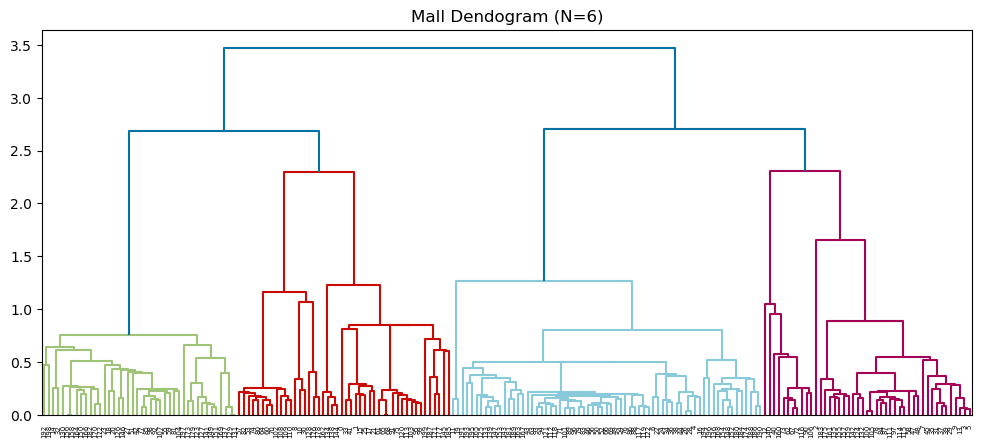

In [48]:
D = gower_distances(X1)
aggl = scipy.cluster.hierarchy.linkage(D)
labels = scipy.cluster.hierarchy.fcluster(aggl, 6, criterion="maxclust")
n = len(set(labels))

# Plot the dendogram
plt.figure(figsize=(12, 5));
plt.title("Mall Dendogram (N={})".format(n)); 
dend = scipy.cluster.hierarchy.dendrogram(aggl) 
plt.savefig('out/mall-agg-5-gower-dendogram.png', transparent=False);

In [49]:
def describe_clusters(X, labels):
    X2 = X.copy()
    X2['ClusterID'] = labels
    print('\nCluster sizes:')
    print(X2.groupby('ClusterID').size())
    
    
    #print(X2.groupby('ClusterID').mean())
    #print(X2.groupby('ClusterID').agg(lambda x: x.value_counts().index[0]))
    
    print('\nCluster stats:')
    display(X2.groupby('ClusterID').describe(include='all').transpose())

describe_clusters(X1, labels)


Cluster sizes:
ClusterID
1    42
2    18
3    28
4    67
5    11
6    34
dtype: int64

Cluster stats:


ClusterID                    1          2           3          4          5  \
AgeBin        count         42         18          28         67         11   
              unique         1          1           1          1          1   
              top     (30, 55]  (55, 100]     (0, 30]   (30, 55]  (55, 100]   
              freq          42         18          28         67         11   
              mean         NaN        NaN         NaN        NaN        NaN   
              std          NaN        NaN         NaN        NaN        NaN   
              min          NaN        NaN         NaN        NaN        NaN   
              25%          NaN        NaN         NaN        NaN        NaN   
              50%          NaN        NaN         NaN        NaN        NaN   
              75%          NaN        NaN         NaN        NaN        NaN   
              max          NaN        NaN         NaN        NaN        NaN   
AnnualIncome  count         42         18          28         67         11   
              unique       NaN        NaN         NaN        NaN        NaN   
              top          NaN        NaN         NaN        NaN        NaN   
              freq         NaN        NaN         NaN        NaN        NaN   
              mean    0.283981  -0.269476  -0.0527283   0.124467  -0.250391   
              std      1.01092   0.754382     1.12137    1.05682   0.641201   
              min     -1.54815   -1.58632      -1.739   -1.66266   -1.54815   
              25%    -0.250391  -0.613001   -0.908814   -0.68934  -0.498493   
              50%     0.398489  -0.250391 -0.00229017   0.054964  -0.403069   
              75%     0.866064  0.0931334    0.627505   0.722929   0.131303   
              max      2.91767    1.23822     2.91767    2.49781   0.703844   
Male          count         42         18          28         67         11   
              unique         1          1           1          1          1   
              top         True       True        True      False      False   
              freq          42         18          28         67         11   
              mean         NaN        NaN         NaN        NaN        NaN   
              std          NaN        NaN         NaN        NaN        NaN   
              min          NaN        NaN         NaN        NaN        NaN   
              25%          NaN        NaN         NaN        NaN        NaN   
              50%          NaN        NaN         NaN        NaN        NaN   
              75%          NaN        NaN         NaN        NaN        NaN   
              max          NaN        NaN         NaN        NaN        NaN   
SpendingScore count         42         18          28         67         11   
              unique       NaN        NaN         NaN        NaN        NaN   
              top          NaN        NaN         NaN        NaN        NaN   
              freq         NaN        NaN         NaN        NaN        NaN   
              mean   -0.148261  -0.503818    0.340243 -0.0975754  -0.385392   
              std      1.14626    0.79511     1.03758   0.963862   0.647073   
              min     -1.91002   -1.83238    -1.75473   -1.75473   -1.75473   
              25%     -1.23064   -1.39564   -0.075702  -0.861839  -0.590088   
              50%    -0.163051   -0.14364     0.34163  -0.201872 -0.0854074   
              75%     0.885132  0.0601734     1.13747   0.399862  0.0310572   
              max      1.73921   0.380451     1.81685    1.89449   0.225165   

ClusterID                     6  
AgeBin        count          34  
              unique          1  
              top       (0, 30]  
              freq           34  
              mean          NaN  
              std           NaN  
              min           NaN  
              25%           NaN  
              50%           NaN  
              75%           NaN  
              max           NaN  
AnnualIncome  count          34  
  

# K-Modes
`kmodes` is an experimental library in Python

In [50]:
kmodes = KModes(n_clusters=6, init='Huang', n_init=100, verbose=0)
kmodes.fit(X1)

KModes(cat_dissim=<function matching_dissim at 0x00000225BA68D378>,
    init='Huang', max_iter=100, n_clusters=6, n_init=100, verbose=0)

In [51]:
kmodes.labels_

array([5, 5, 3, 3, 1, 3, 1, 3, 0, 3, 0, 1, 0, 3, 2, 5, 1, 5, 2, 1, 2, 3,
       1, 2, 1, 5, 1, 2, 1, 3, 0, 3, 2, 5, 1, 3, 1, 3, 1, 3, 0, 5, 2, 1,
       1, 3, 1, 3, 1, 1, 1, 2, 1, 0, 1, 2, 1, 0, 3, 2, 0, 0, 0, 1, 0, 5,
       1, 0, 5, 1, 0, 1, 0, 0, 0, 0, 1, 0, 3, 1, 0, 0, 0, 1, 3, 2, 1, 3,
       1, 1, 0, 5, 1, 1, 1, 5, 1, 1, 1, 5, 3, 1, 0, 0, 2, 1, 0, 2, 0, 0,
       0, 3, 1, 2, 3, 3, 0, 1, 1, 1, 5, 1, 1, 2, 3, 1, 4, 4, 0, 4, 4, 4,
       3, 1, 5, 3, 1, 2, 5, 1, 0, 2, 3, 1, 5, 5, 2, 1, 1, 2, 2, 2, 1, 1,
       1, 3, 2, 3, 2, 3, 0, 3, 5, 1, 2, 1, 2, 1, 1, 2, 2, 4, 2, 2, 1, 3,
       0, 5, 0, 2, 1, 1, 2, 3, 1, 5, 1, 5, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2,
       2, 5], dtype=uint8)

[[True -0.2503914553668267 0.18634349141534906
  Interval(55, 100, closed='right')]
 [False -0.021374880336192604 -0.31833679783455493
  Interval(30, 55, closed='right')]
 [True 0.6656748447557098 -0.16305055498843063
  Interval(30, 55, closed='right')]
 [False 0.6656748447557098 0.8851315842229084
  Interval(0, 30, closed='right')]
 [True 0.3984888405533033 0.9627747056459706
  Interval(30, 55, closed='right')]
 [True -1.7389991930659485 1.622741237741999
  Interval(0, 30, closed='right')]]

Cluster sizes:
ClusterID
0    34
1    72
2    34
3    32
4     6
5    22
dtype: int64

Cluster stats:


ClusterID                     0           1         2          3         4  \
AgeBin        count          34          72        34         32         6   
              unique          3           2         2          1         2   
              top     (55, 100]    (30, 55]  (30, 55]    (0, 30]  (30, 55]   
              freq           29          69        33         32         5   
              mean          NaN         NaN       NaN        NaN       NaN   
              std           NaN         NaN       NaN        NaN       NaN   
              min           NaN         NaN       NaN        NaN       NaN   
              25%           NaN         NaN       NaN        NaN       NaN   
              50%           NaN         NaN       NaN        NaN       NaN   
              75%           NaN         NaN       NaN        NaN       NaN   
              max           NaN         NaN       NaN        NaN       NaN   
AnnualIncome  count          34          72        34         32         6   
              unique        NaN         NaN       NaN        NaN       NaN   
              top           NaN         NaN       NaN        NaN       NaN   
              freq          NaN         NaN       NaN        NaN       NaN   
              mean    -0.260495    0.105326  0.310924  -0.369671  0.500274   
              std       0.65077     1.02485   1.11597   0.935044  0.249322   
              min      -1.58632    -1.66266  -1.54815   -1.70083  0.398489   
              25%     -0.546205   -0.679798 -0.641628     -1.176  0.398489   
              50%     -0.250391 -0.00229017  0.589336  -0.250391  0.398489   
              75%     0.0931334    0.665675  0.999657   0.446201  0.398489   
              max       1.23822     2.49781   2.91767    1.42906    1.0092   
Male          count          34          72        34         32         6   
              unique          2           2         1          2         1   
              top          True       False      True      False      True   
              freq           23          70        34         31         6   
              mean          NaN         NaN       NaN        NaN       NaN   
              std           NaN         NaN       NaN        NaN       NaN   
              min           NaN         NaN       NaN        NaN       NaN   
              25%           NaN         NaN       NaN        NaN       NaN   
              50%           NaN         NaN       NaN        NaN       NaN   
              75%           NaN         NaN       NaN        NaN       NaN   
              max           NaN         NaN       NaN        NaN       NaN   
SpendingScore count          34          72        34         32         6   
              unique        NaN         NaN       NaN        NaN       NaN   
              top           NaN         NaN       NaN        NaN       NaN   
              freq          NaN         NaN       NaN        NaN       NaN   
              mean    -0.373144   -0.104818 -0.223567   0.564854  0.406332   
              std      0.707886    0.930464   1.17021    0.80677   1.24269   
              min      -1.83238    -1.75473  -1.91002   -1.71591  -1.59945   
              25%     -0.590088    -0.77449  -1.27917  0.0213519 -0.201872   
              50%    -0.0854074   -0.221283 -0.260104   0.885132  0.962775   
              75%      0.176638    0.351335  0.788078    1.10836  0.962775   
              max      0.380451     1.89449   1.66156    1.70038   1.73921   

ClusterID                      5  
AgeBin        count           22  
              unique           1  
              top        (0, 30]  
              freq            22  
              mean           NaN  
              std            NaN  
              min            NaN  
              25%            NaN  
              50%            NaN  
              75%            NaN  
              max            NaN  
AnnualIncome  count           22  
              unique         NaN  

C:\Users\st50\AppData\Roaming\Python\Python36\site-packages\matplotlib\figure.py:98: MatplotlibDeprecationWarning: 
Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  "Adding an axes using the same arguments as a previous axes "


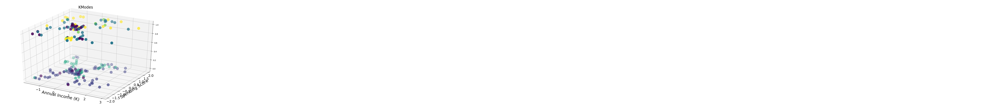

In [52]:
# Print the cluster centroids
print(kmodes.cluster_centroids_)

kmodes.labels_

describe_clusters(X1, kmodes.labels_)

plt.style.use('default');
fig = plt.figure(figsize=(16, 10));
plt.grid(True);
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X1['AnnualIncome'], X1['SpendingScore'], X1['Male'], s=200, c=kmodes.labels_);
plt.title("KModes", fontsize=20);
plt.xlabel('Annual Income (K)', fontsize=22);
plt.ylabel('Spending Score', fontsize=22);
plt.xticks(fontsize=18);
plt.yticks(fontsize=18);
plt.savefig('out/mall-kmodes-6-3d.png', transparent=False);

# Distance Metrics

,id,dim1,dim2
0,A,1,1
1,B,2,1
2,C,5,5



Points A and B:
Euclidean distance: 1.00
Manhattan distance: 1.00
Chebyshev distance: 1.00
Canberra distance: 0.33
Cosine distance: 0.05

Points A and C:
Euclidean distance: 5.66
Manhattan distance: 8.00
Chebyshev distance: 4.00
Canberra distance: 1.33
Cosine distance: 0.00

Points B and C:
Euclidean distance: 5.00
Manhattan distance: 7.00
Chebyshev distance: 4.00
Canberra distance: 1.10
Cosine distance: 0.05


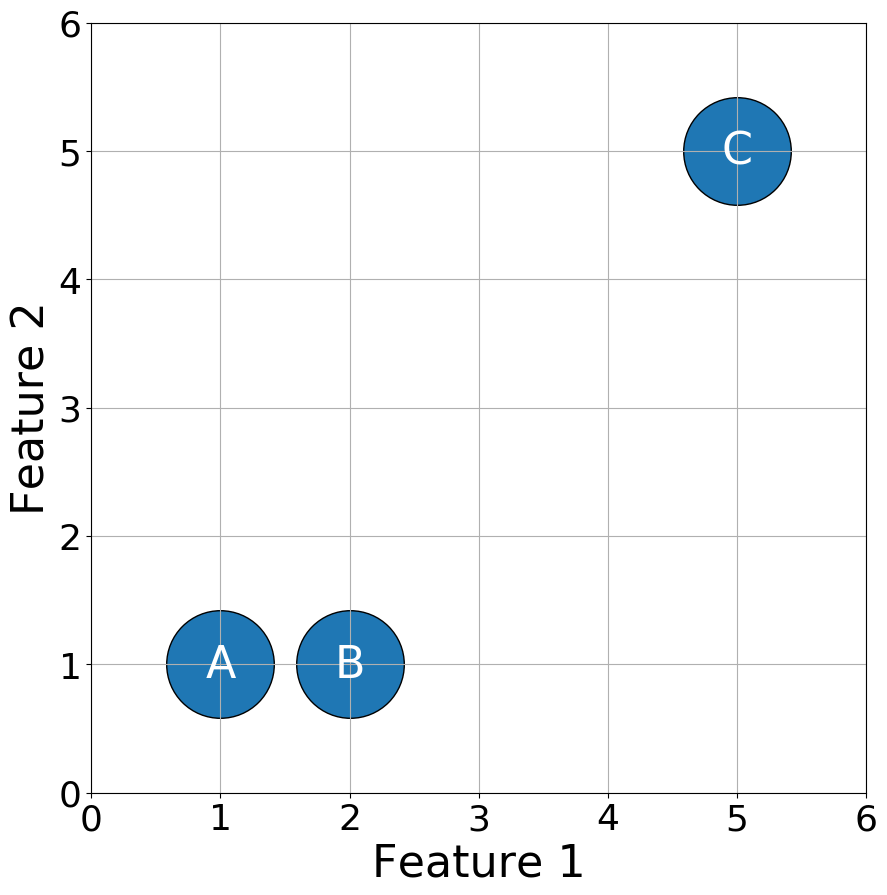

In [53]:
import scipy.spatial.distance as dist
import numpy as np

# Prepare 3 vectors (data points) of 2 dimensions
points = pd.DataFrame(data={'id':['A', 'B', 'C'], 'dim1':[1, 2, 5], 'dim2':[1, 1, 5]})
display(points.head())

for combo in itertools.combinations(points['id'], 2):
    v1 = points[points['id'] == combo[0]][['dim1', 'dim2']]
    v2 = points[points['id'] == combo[1]][['dim1', 'dim2']]
    
    print('\nPoints {} and {}:'.format(combo[0], combo[1]))
    print('Euclidean distance: {:.2f}'.format(dist.euclidean(v1, v2)))
    print('Manhattan distance: {:.2f}'.format(dist.cityblock(v1, v2)))
    print('Chebyshev distance: {:.2f}'.format(dist.chebyshev(v1, v2)))
    print('Canberra distance: {:.2f}'.format(dist.canberra(v1, v2)))
    print('Cosine distance: {:.2f}'.format(dist.cosine(v1, v2)))
    
    
plt.style.use('default');

plt.figure(figsize=(10, 10));
plt.grid(True);

plt.scatter(points['dim1'], points['dim2'], s=6000, marker='o', edgecolors='black');
#plt.title("Distances", fontsize=20);
plt.xlabel('Feature 1', fontsize=32);
plt.ylabel('Feature 2', fontsize=32);
plt.xticks(fontsize=26);
plt.yticks(fontsize=26);
plt.xlim(left=0, right=6);
plt.ylim(bottom=0, top=6);

for i, txt in enumerate(points['id']):
    plt.text(x=points['dim1'].iloc[i], y=points['dim2'].iloc[i], s=txt, fontsize=32, 
             horizontalalignment='center', verticalalignment='center', color='white');
    


plt.savefig('out/distances.png', transparent=False);

## Categorical Features

In [54]:
points = pd.DataFrame(data={'id':['A', 'B', 'C'], 'dim1':['young', 'young', 'old'], 
                            'dim2':['male', 'male', 'female'], 'dim3':['rural', 'city', 'city'],
                            'dim4':['student', 'student', 'prof'], 'dim5':['low', 'low', 'high'],})
display(points.head())

for combo in itertools.combinations(points['id'], 2):
    v1 = points[points['id'] == combo[0]][['dim1', 'dim2', 'dim3', 'dim4', 'dim5']]
    v2 = points[points['id'] == combo[1]][['dim1', 'dim2', 'dim3', 'dim4', 'dim5']]
    
    print('\nPoints {} and {}:'.format(combo[0], combo[1]))
    print('Hamming distance: {:.2f}'.format(dist.hamming(v1, v2)))

,id,dim1,dim2,dim3,dim4,dim5
0,A,young,male,rural,student,low
1,B,young,male,city,student,low
2,C,old,female,city,prof,high



Points A and B:
Hamming distance: 0.20

Points A and C:
Hamming distance: 1.00

Points B and C:
Hamming distance: 0.80
